[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/repos-especializacion-UdeA/monografia_modelos/blob/main/04_featuras_EDA.ipynb)

# Analisis estadistico de los vectores caracteristicos

In [1]:
try:
    import google.colab 
    !wget --no-cache -O init.py -q https://raw.githubusercontent.com/repos-especializacion-UdeA/monografia_modelos/refs/heads/main/init.py
    from init import init; init(force_download=False)
except ImportError:
    print("Ejecucion del notebook en entorno local")

Ejecucion del notebook en entorno local


## Objetivo a desarrollar

* Realizar un EDA para las caracteristicas extraidas (RMS, WL, IAV)
* Comprender el comportamiento de los datos

## Actividades

To Do...

## 1. Librerias y configuraciones previas

In [2]:
# Verificacion de librerias necesarias antes de empezar
try:
    import scipy.io
    print("La librería 'scipy' está instalada y se ha importado correctamente.")
except ImportError:
    print("La librería 'scipy' no está instalada.")
    print("Instalando 'scipy'...")
    !pip install scipy

try:
    import libemg
    print("La librería 'libEMG' está instalada y se ha importado correctamente.")
except ImportError:
    print("La librería 'libEMG' no está instalada.")
    print("Instalando 'libEMG'...")
    !pip install libemg

try:
    import imblearn
    print("La librería 'imblearn' está instalada y se ha importado correctamente.")
except ImportError:
    print("La librería 'imblearn' no está instalada.")
    print("Instalando 'imblearn'...")
    !pip install imblearn

La librería 'scipy' está instalada y se ha importado correctamente.
La librería 'libEMG' está instalada y se ha importado correctamente.
La librería 'imblearn' está instalada y se ha importado correctamente.


In [ ]:
# Tratamiento de datos
# ==============================================================================
import pandas as pd
import numpy as np

# Almacenar en caché los resultados de funciones en el disco
# ==============================================================================
import joblib


# Gestion de librerias
# ==============================================================================
from importlib import reload

# Matemáticas y estadísticas
# ==============================================================================
import math

# Preparación de datos
# ==============================================================================
from imblearn.over_sampling import RandomOverSampler
from sklearn.neighbors import LocalOutlierFactor
from imblearn.under_sampling import RandomUnderSampler

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns


# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

# Formateo y estilo
# ==============================================================================
from IPython.display import Markdown, display

# Biblioteca scipy y componentes
# ==============================================================================
import scipy.io
from scipy import signal

# Bliblioteca de archivos
# ==============================================================================
import requests
from tqdm import tqdm
import os
import zipfile
import sys
import copy
import re

# Biblioteca libemg
# ==============================================================================
from libemg.data_handler import OfflineDataHandler, RegexFilter
from libemg.utils import get_windows
from libemg.feature_extractor import FeatureExtractor
from libemg import filtering

# 2. Funciones

In [4]:
def load_and_merge_csv(directory_path):
    """
    Carga todos los archivos CSV de un directorio, extrae un número identificador del nombre de archivo
    y concatena todos los datos en un único DataFrame con una columna adicional 'subject'.

    Parámetros
    ----------
    directory_path : str
        Ruta al directorio que contiene los archivos CSV.

    Retorna
    -------
    pd.DataFrame
        DataFrame con los datos combinados y una columna adicional 'subject' que identifica
        el origen de cada archivo.

    Requisitos
    ----------
    - Los archivos deben tener nombres con un número identificador, como:
      'subject_1_features.csv', 'subject_2_features.csv', etc.
    """
    # Obtener todos los archivos CSV del directorio
    all_files = [f for f in os.listdir(directory_path) if f.endswith('.csv')]
    
    # Lista para almacenar los DataFrames cargados
    merged_data = []

    for file in all_files:
        # Construir la ruta completa al archivo
        file_path = os.path.join(directory_path, file)

        # Leer el archivo CSV en un DataFrame
        df = pd.read_csv(file_path)

        # Extraer el número identificador desde el nombre del archivo (por ejemplo, 1 en 'subject_1_features.csv')
        match = re.search(r'\d+', file)
        file_id = int(match.group()) if match else None  # Si no se encuentra número, se asigna None

        # Agregar una nueva columna con el identificador del sujeto
        df['subject'] = file_id

        # Añadir el DataFrame a la lista
        merged_data.append(df)

    # Concatenar todos los DataFrames en uno solo
    return pd.concat(merged_data, ignore_index=True)


In [10]:
def split_features_by_type(df):
    """
    Divide un DataFrame en un diccionario donde las claves son los tipos de características
    (extraídas del prefijo de las columnas) y los valores son sub-DataFrames que incluyen
    las columnas correspondientes a ese tipo, junto con 'restimulus' y 'subject'.

    Parámetros
    ----------
    df : pd.DataFrame
        DataFrame que contiene columnas con nombres formateados como 'TIPO_fN', donde 'TIPO'
        es el nombre de la característica (ej. 'RMS', 'MAV') y 'fN' es el índice del feature.

    Retorna
    -------
    dict of str to pd.DataFrame
        Diccionario en el que cada clave es un tipo de característica y cada valor es un
        DataFrame que contiene únicamente las columnas asociadas a ese tipo, más las columnas
        'restimulus' y 'subject'.

    Notes
    -----
    - Solo se consideran columnas cuyo nombre inicia con letras mayúsculas seguidas de guión bajo ('_').
    - Las columnas 'restimulus' y 'subject' se incluyen en cada DataFrame resultante.
    """
    feature_dict = {}

    # Paso 1: Clasificar columnas según el tipo de característica
    for column in df.columns:
        # Usar expresión regular para extraer el prefijo del nombre de la columna
        match = re.match(r'([A-Z]+)_', column)
        if match:
            feature_type = match.group(1)  # e.g., 'RMS' de 'RMS_f0'
            # Inicializar lista si es la primera vez que se encuentra este tipo
            if feature_type not in feature_dict:
                feature_dict[feature_type] = []
            # Agregar columna al grupo correspondiente
            feature_dict[feature_type].append(column)

    # Paso 2: Construir un DataFrame por tipo de característica,
    # incluyendo 'restimulus' y 'subject' como columnas comunes
    for feature_type in feature_dict:
        # Asegurarse de que 'restimulus' y 'subject' estén incluidos
        feature_dict[feature_type] = df[feature_dict[feature_type] + ['restimulus', 'subject']]

    return feature_dict

In [13]:
def rename_feature_columns(df):
    """
    Renombra las columnas de características de un DataFrame para que reflejen el canal en lugar del índice del feature.

    Esta función busca columnas con formato 'TIPO_fN' (por ejemplo, 'RMS_f0', 'MAV_f1'), 
    y las renombra como 'TIPO_chM', donde M = N + 1. Esto asume que el sufijo numérico representa el canal.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame que contiene columnas con nombres de características codificadas como 'TIPO_fN'.

    Returns
    -------
    pd.DataFrame
        El mismo DataFrame con las columnas renombradas de acuerdo al nuevo formato 'TIPO_chN'.

    Examples
    --------
    >>> df.columns
    Index(['RMS_f0', 'RMS_f1', 'MAV_f0', 'restimulus', 'subject'])
    >>> df = rename_feature_columns(df)
    >>> df.columns
    Index(['RMS_ch1', 'RMS_ch2', 'MAV_ch1', 'restimulus', 'subject'])
    """
    new_columns = []

    for col in df.columns:
        # Buscar columnas con formato 'TIPO_fN'
        match = re.match(r'([A-Z]+)_f(\d+)', col)
        if match:
            prefix, idx = match.groups()
            # Cambiar a formato 'TIPO_chN' (incrementando en 1 el índice)
            new_col = f"{prefix}_ch{int(idx) + 1}"
            new_columns.append(new_col)
        else:
            # Conservar columnas que no cumplen el patrón (como 'restimulus', 'subject')
            new_columns.append(col)

    # Aplicar los nuevos nombres de columnas al DataFrame
    df.columns = new_columns
    return df


In [15]:
def split_features_by_type(df):
    """
    Divide un DataFrame de características en un diccionario según el tipo de característica.

    Identifica los tipos de características a partir del prefijo de los nombres de las columnas 
    (por ejemplo, 'RMS_f0', 'MAV_f1') y agrupa en un diccionario los subconjuntos de columnas 
    correspondientes a cada tipo. Cada subgrupo incluye también las columnas 'restimulus' y 'subject'.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame con columnas nombradas según el patrón 'TIPO_fN', donde 'TIPO' indica el tipo 
        de característica (por ejemplo, 'RMS', 'MAV') y 'fN' el índice del canal.

    Returns
    -------
    dict of str to pd.DataFrame
        Diccionario donde las claves son los nombres de características (como 'RMS', 'MAV') 
        y los valores son DataFrames que contienen las columnas correspondientes, 
        más las columnas 'restimulus' y 'subject'.

    Raises
    ------
    KeyError
        Si las columnas 'restimulus' o 'subject' no se encuentran en el DataFrame.

    Examples
    --------
    >>> df.columns
    Index(['RMS_f0', 'RMS_f1', 'MAV_f0', 'restimulus', 'subject'])
    >>> feature_dict = split_features_by_type(df)
    >>> feature_dict['RMS'].columns
    Index(['RMS_f0', 'RMS_f1', 'restimulus', 'subject'])
    """
    # Validar que las columnas de etiqueta existan
    for col in ['restimulus', 'subject']:
        if col not in df.columns:
            raise KeyError(f"La columna obligatoria '{col}' no se encuentra en el DataFrame.")

    feature_dict = {}

    # Agrupar columnas por prefijo (e.g., 'RMS', 'MAV') usando expresión regular
    for column in df.columns:
        match = re.match(r'([A-Z]+)_', column)
        if match:
            feature_type = match.group(1)
            if feature_type not in feature_dict:
                feature_dict[feature_type] = []
            feature_dict[feature_type].append(column)

    # Crear DataFrames por tipo e incluir etiquetas comunes
    for feature_type in feature_dict:
        feature_columns = feature_dict[feature_type] + ['restimulus', 'subject']
        feature_dict[feature_type] = df[feature_columns]

    return feature_dict

## 3. Variables del entorno

In [98]:
ROOT_DIR =  './'
DATA_DIR =  ROOT_DIR + 'local/data/'
if not os.path.exists(ROOT_DIR):
    os.makedirs(ROOT_DIR)    
RAW_DATA_DIR = DATA_DIR + 'raw'
if not os.path.exists(RAW_DATA_DIR):
    os.makedirs(RAW_DATA_DIR)
RAW_DATA_DIR_NPY = DATA_DIR + 'raw_numpy'
if not os.path.exists(RAW_DATA_DIR_NPY):
    os.makedirs(RAW_DATA_DIR_NPY)
RAW_SUBSET_DATA_DIR = DATA_DIR + 'raw_subset'
if not os.path.exists(RAW_SUBSET_DATA_DIR):
    os.makedirs(RAW_SUBSET_DATA_DIR)
FILTERED_SUBSET_DATA_DIR = DATA_DIR + 'filtered_subset'
if not os.path.exists(FILTERED_SUBSET_DATA_DIR):
    os.makedirs(FILTERED_SUBSET_DATA_DIR)
FEATURES_SUBSET_DATA_DIR = DATA_DIR + 'features_subset'
if not os.path.exists(FEATURES_SUBSET_DATA_DIR):
    os.makedirs(FEATURES_SUBSET_DATA_DIR)
FEATURES_SUBSET_BALANCED_DATA = DATA_DIR + 'features_subset_balanced'
if not os.path.exists(FEATURES_SUBSET_BALANCED_DATA):
    os.makedirs(FEATURES_SUBSET_BALANCED_DATA)

print("Directorio de trabajo:", ROOT_DIR)
print("Directorio de datos:", DATA_DIR)
print("Directorio de datos crudos:", RAW_DATA_DIR)
print("Directorio de datos crudos (numpy):", RAW_DATA_DIR_NPY)
print("Directorio de datos crudos (subconjunto):", RAW_SUBSET_DATA_DIR)
print("Directorio de datos filtrados (subconjunto):", FILTERED_SUBSET_DATA_DIR)
print("Directorio de datos de características (subconjunto):", FEATURES_SUBSET_DATA_DIR)
print("Directorio de datos de características (subconjunto balanceado):", FEATURES_SUBSET_BALANCED_DATA)

Directorio de trabajo: ./
Directorio de datos: ./local/data/
Directorio de datos crudos: ./local/data/raw
Directorio de datos crudos (numpy): ./local/data/raw_numpy
Directorio de datos crudos (subconjunto): ./local/data/raw_subset
Directorio de datos filtrados (subconjunto): ./local/data/filtered_subset
Directorio de datos de características (subconjunto): ./local/data/features_subset
Directorio de datos de características (subconjunto balanceado): ./local/data/features_subset_balanced


## 4. Carga del dataset de las caracteristicas

Carga y combinación de los datos en un solo dataframe

El dataframe en el que se combinaron los datos fue: `merged_df` 

In [8]:
# Load and merge CSV files
merged_df = load_and_merge_csv(FEATURES_SUBSET_DATA_DIR)
# Display the first few rows of the merged DataFrame
merged_df.shape

(21594, 32)

In [9]:
# Display the first few rows of the merged DataFrame
merged_df.head()

,RMS_f0,RMS_f1,RMS_f2,RMS_f3,RMS_f4,RMS_f5,RMS_f6,RMS_f7,RMS_f8,RMS_f9,...,IAV_f2,IAV_f3,IAV_f4,IAV_f5,IAV_f6,IAV_f7,IAV_f8,IAV_f9,restimulus,subject
0,0.186650,0.064954,0.007956,0.002370,0.002316,0.002340,0.011819,0.025321,0.002160,0.021807,...,0.232948,0.071085,0.069483,0.069999,0.258277,0.694282,0.064724,0.612147,0.0,10
1,0.147451,0.024014,0.010991,0.002311,0.002293,0.003349,0.061164,0.166142,0.001954,0.076644,...,0.272982,0.069339,0.068797,0.098256,1.571479,3.832499,0.058596,1.669581,0.0,10
2,0.214203,0.027382,0.070140,0.002309,0.002581,0.005600,0.146619,0.526502,0.002533,0.311813,...,1.711660,0.069260,0.077072,0.164330,4.212271,14.597008,0.073951,8.334860,-1.0,10
3,0.399017,0.076350,0.197038,0.002660,0.003711,0.007535,0.219384,0.941561,0.005587,0.659597,...,5.545176,0.079337,0.109198,0.225469,6.542571,27.803968,0.157240,19.179181,1.0,10
4,0.664900,0.140433,0.336471,0.003742,0.006055,0.008054,0.247355,1.144152,0.011067,0.949690,...,9.960689,0.110684,0.177791,0.241623,7.419627,34.309421,0.322391,28.336134,1.0,10


In [14]:
# Se renombran las columnas del DataFrame
merged_df = rename_feature_columns(merged_df)
# Se verifica el resultado
merged_df.head()

,RMS_ch1,RMS_ch2,RMS_ch3,RMS_ch4,RMS_ch5,RMS_ch6,RMS_ch7,RMS_ch8,RMS_ch9,RMS_ch10,...,IAV_ch3,IAV_ch4,IAV_ch5,IAV_ch6,IAV_ch7,IAV_ch8,IAV_ch9,IAV_ch10,restimulus,subject
0,0.186650,0.064954,0.007956,0.002370,0.002316,0.002340,0.011819,0.025321,0.002160,0.021807,...,0.232948,0.071085,0.069483,0.069999,0.258277,0.694282,0.064724,0.612147,0.0,10
1,0.147451,0.024014,0.010991,0.002311,0.002293,0.003349,0.061164,0.166142,0.001954,0.076644,...,0.272982,0.069339,0.068797,0.098256,1.571479,3.832499,0.058596,1.669581,0.0,10
2,0.214203,0.027382,0.070140,0.002309,0.002581,0.005600,0.146619,0.526502,0.002533,0.311813,...,1.711660,0.069260,0.077072,0.164330,4.212271,14.597008,0.073951,8.334860,-1.0,10
3,0.399017,0.076350,0.197038,0.002660,0.003711,0.007535,0.219384,0.941561,0.005587,0.659597,...,5.545176,0.079337,0.109198,0.225469,6.542571,27.803968,0.157240,19.179181,1.0,10
4,0.664900,0.140433,0.336471,0.003742,0.006055,0.008054,0.247355,1.144152,0.011067,0.949690,...,9.960689,0.110684,0.177791,0.241623,7.419627,34.309421,0.322391,28.336134,1.0,10


Ahora se divide el dataframe en un diccionario de dataframes por caracteristicas. El diccionario con las caracteristicas se va a llamar `features_dict`:

In [16]:
# Dividir las características por tipo
features_dict = split_features_by_type(merged_df)

In [17]:
features_dict.keys()

dict_keys(['RMS', 'WL', 'IAV'])

In [18]:
for feature_name, df in features_dict.items():
    print(f"Head de {feature_name}:")
    display(df.head())

Head de RMS:


,RMS_ch1,RMS_ch2,RMS_ch3,RMS_ch4,RMS_ch5,RMS_ch6,RMS_ch7,RMS_ch8,RMS_ch9,RMS_ch10,restimulus,subject
0,0.186650,0.064954,0.007956,0.002370,0.002316,0.002340,0.011819,0.025321,0.002160,0.021807,0.0,10
1,0.147451,0.024014,0.010991,0.002311,0.002293,0.003349,0.061164,0.166142,0.001954,0.076644,0.0,10
2,0.214203,0.027382,0.070140,0.002309,0.002581,0.005600,0.146619,0.526502,0.002533,0.311813,-1.0,10
3,0.399017,0.076350,0.197038,0.002660,0.003711,0.007535,0.219384,0.941561,0.005587,0.659597,1.0,10
4,0.664900,0.140433,0.336471,0.003742,0.006055,0.008054,0.247355,1.144152,0.011067,0.949690,1.0,10


Head de WL:


,WL_ch1,WL_ch2,WL_ch3,WL_ch4,WL_ch5,WL_ch6,WL_ch7,WL_ch8,WL_ch9,WL_ch10,restimulus,subject
0,0.106641,0.076213,0.007215,0.000068,0.000094,0.000581,0.034643,0.079613,0.000366,0.035208,0.0,10
1,0.049349,0.033643,0.036538,0.000085,0.000141,0.002311,0.103924,0.354562,0.000337,0.197743,0.0,10
2,0.172856,0.040341,0.134860,0.000176,0.000825,0.003709,0.137281,0.655771,0.001938,0.463982,-1.0,10
3,0.335438,0.090400,0.224078,0.000936,0.002410,0.001777,0.078484,0.537102,0.006376,0.533252,1.0,10
4,0.426215,0.096118,0.172328,0.002034,0.004095,0.000169,0.019049,0.166585,0.008314,0.326229,1.0,10


Head de IAV:


,IAV_ch1,IAV_ch2,IAV_ch3,IAV_ch4,IAV_ch5,IAV_ch6,IAV_ch7,IAV_ch8,IAV_ch9,IAV_ch10,restimulus,subject
0,5.510804,1.818598,0.232948,0.071085,0.069483,0.069999,0.258277,0.694282,0.064724,0.612147,0.0,10
1,4.416803,0.655907,0.272982,0.069339,0.068797,0.098256,1.571479,3.832499,0.058596,1.669581,0.0,10
2,6.228921,0.733375,1.711660,0.069260,0.077072,0.164330,4.212271,14.597008,0.073951,8.334860,-1.0,10
3,11.577850,2.134840,5.545176,0.079337,0.109198,0.225469,6.542571,27.803968,0.157240,19.179181,1.0,10
4,19.574575,4.123925,9.960689,0.110684,0.177791,0.241623,7.419627,34.309421,0.322391,28.336134,1.0,10


Se agrega para las columnas `restimulus` y `subject` las respectivas columnas asociadas a la categoria.

In [19]:
for feature_type, df in features_dict.items():
    df.loc[:, 'restimulus_cat'] = df['restimulus'].astype('category')
    df.loc[:, 'subject_cat'] = df['subject'].astype('category')

Se verifica el resultado

In [20]:
for feature_name, df in features_dict.items():
    print(f"Head de {feature_name}:")
    display(df.head())

Head de RMS:


,RMS_ch1,RMS_ch2,RMS_ch3,RMS_ch4,RMS_ch5,RMS_ch6,RMS_ch7,RMS_ch8,RMS_ch9,RMS_ch10,restimulus,subject,restimulus_cat,subject_cat
0,0.186650,0.064954,0.007956,0.002370,0.002316,0.002340,0.011819,0.025321,0.002160,0.021807,0.0,10,0.0,10
1,0.147451,0.024014,0.010991,0.002311,0.002293,0.003349,0.061164,0.166142,0.001954,0.076644,0.0,10,0.0,10
2,0.214203,0.027382,0.070140,0.002309,0.002581,0.005600,0.146619,0.526502,0.002533,0.311813,-1.0,10,-1.0,10
3,0.399017,0.076350,0.197038,0.002660,0.003711,0.007535,0.219384,0.941561,0.005587,0.659597,1.0,10,1.0,10
4,0.664900,0.140433,0.336471,0.003742,0.006055,0.008054,0.247355,1.144152,0.011067,0.949690,1.0,10,1.0,10


Head de WL:


,WL_ch1,WL_ch2,WL_ch3,WL_ch4,WL_ch5,WL_ch6,WL_ch7,WL_ch8,WL_ch9,WL_ch10,restimulus,subject,restimulus_cat,subject_cat
0,0.106641,0.076213,0.007215,0.000068,0.000094,0.000581,0.034643,0.079613,0.000366,0.035208,0.0,10,0.0,10
1,0.049349,0.033643,0.036538,0.000085,0.000141,0.002311,0.103924,0.354562,0.000337,0.197743,0.0,10,0.0,10
2,0.172856,0.040341,0.134860,0.000176,0.000825,0.003709,0.137281,0.655771,0.001938,0.463982,-1.0,10,-1.0,10
3,0.335438,0.090400,0.224078,0.000936,0.002410,0.001777,0.078484,0.537102,0.006376,0.533252,1.0,10,1.0,10
4,0.426215,0.096118,0.172328,0.002034,0.004095,0.000169,0.019049,0.166585,0.008314,0.326229,1.0,10,1.0,10


Head de IAV:


,IAV_ch1,IAV_ch2,IAV_ch3,IAV_ch4,IAV_ch5,IAV_ch6,IAV_ch7,IAV_ch8,IAV_ch9,IAV_ch10,restimulus,subject,restimulus_cat,subject_cat
0,5.510804,1.818598,0.232948,0.071085,0.069483,0.069999,0.258277,0.694282,0.064724,0.612147,0.0,10,0.0,10
1,4.416803,0.655907,0.272982,0.069339,0.068797,0.098256,1.571479,3.832499,0.058596,1.669581,0.0,10,0.0,10
2,6.228921,0.733375,1.711660,0.069260,0.077072,0.164330,4.212271,14.597008,0.073951,8.334860,-1.0,10,-1.0,10
3,11.577850,2.134840,5.545176,0.079337,0.109198,0.225469,6.542571,27.803968,0.157240,19.179181,1.0,10,1.0,10
4,19.574575,4.123925,9.960689,0.110684,0.177791,0.241623,7.419627,34.309421,0.322391,28.336134,1.0,10,1.0,10


## 5. EDA simple

#### 5.1. RMS

In [21]:
rms_df = features_dict['RMS']
rms_df.head()

,RMS_ch1,RMS_ch2,RMS_ch3,RMS_ch4,RMS_ch5,RMS_ch6,RMS_ch7,RMS_ch8,RMS_ch9,RMS_ch10,restimulus,subject,restimulus_cat,subject_cat
0,0.186650,0.064954,0.007956,0.002370,0.002316,0.002340,0.011819,0.025321,0.002160,0.021807,0.0,10,0.0,10
1,0.147451,0.024014,0.010991,0.002311,0.002293,0.003349,0.061164,0.166142,0.001954,0.076644,0.0,10,0.0,10
2,0.214203,0.027382,0.070140,0.002309,0.002581,0.005600,0.146619,0.526502,0.002533,0.311813,-1.0,10,-1.0,10
3,0.399017,0.076350,0.197038,0.002660,0.003711,0.007535,0.219384,0.941561,0.005587,0.659597,1.0,10,1.0,10
4,0.664900,0.140433,0.336471,0.003742,0.006055,0.008054,0.247355,1.144152,0.011067,0.949690,1.0,10,1.0,10


#### 5.1.1. Inspección Inicial del Dataset

* Dimensiones del DataFrame

In [22]:
rms_df.shape

(21594, 14)

* Tipos de datos

In [23]:
rms_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21594 entries, 0 to 21593
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   RMS_ch1         21594 non-null  float64 
 1   RMS_ch2         21594 non-null  float64 
 2   RMS_ch3         21594 non-null  float64 
 3   RMS_ch4         21594 non-null  float64 
 4   RMS_ch5         21594 non-null  float64 
 5   RMS_ch6         21594 non-null  float64 
 6   RMS_ch7         21594 non-null  float64 
 7   RMS_ch8         21594 non-null  float64 
 8   RMS_ch9         21594 non-null  float64 
 9   RMS_ch10        21594 non-null  float64 
 10  restimulus      21594 non-null  float64 
 11  subject         21594 non-null  int64   
 12  restimulus_cat  21594 non-null  category
 13  subject_cat     21594 non-null  category
dtypes: category(2), float64(11), int64(1)
memory usage: 2.0 MB


* Valores nulos

In [24]:
rms_df.isnull().sum()

RMS_ch1           0
RMS_ch2           0
RMS_ch3           0
RMS_ch4           0
RMS_ch5           0
RMS_ch6           0
RMS_ch7           0
RMS_ch8           0
RMS_ch9           0
RMS_ch10          0
restimulus        0
subject           0
restimulus_cat    0
subject_cat       0
dtype: int64

* Estadísticas descriptivas

In [25]:
rms_columns = [col for col in rms_df.columns if "RMS" in col]
rms_df[rms_columns].describe()

,RMS_ch1,RMS_ch2,RMS_ch3,RMS_ch4,RMS_ch5,RMS_ch6,RMS_ch7,RMS_ch8,RMS_ch9,RMS_ch10
count,21594.000000,21594.000000,21594.000000,21594.000000,21594.000000,21594.000000,21594.000000,21594.000000,21594.000000,21594.000000
mean,0.327002,0.189303,0.150283,0.070692,0.033849,0.109544,0.387434,0.482573,0.152121,0.255340
std,0.467080,0.288337,0.253705,0.189489,0.067859,0.250088,0.535453,0.552697,0.270926,0.375481
min,0.000374,0.000323,0.000315,0.000333,0.000326,0.000406,0.000361,0.000451,0.000340,0.000273
25%,0.007035,0.003387,0.002692,0.002428,0.002522,0.004134,0.052696,0.085096,0.002606,0.039387
50%,0.104249,0.060505,0.023528,0.004073,0.004685,0.032083,0.187517,0.277685,0.034917,0.139191
75%,0.472926,0.277147,0.196554,0.059696,0.032870,0.108196,0.504527,0.706979,0.189169,0.315512
max,3.608882,4.247692,2.656120,3.393174,0.809771,3.264254,4.705026,4.359882,3.207452,4.230890


#### 5.1.2. Analisis univariado

##### 5.1.2.1. Variables numericas

* Histogramas

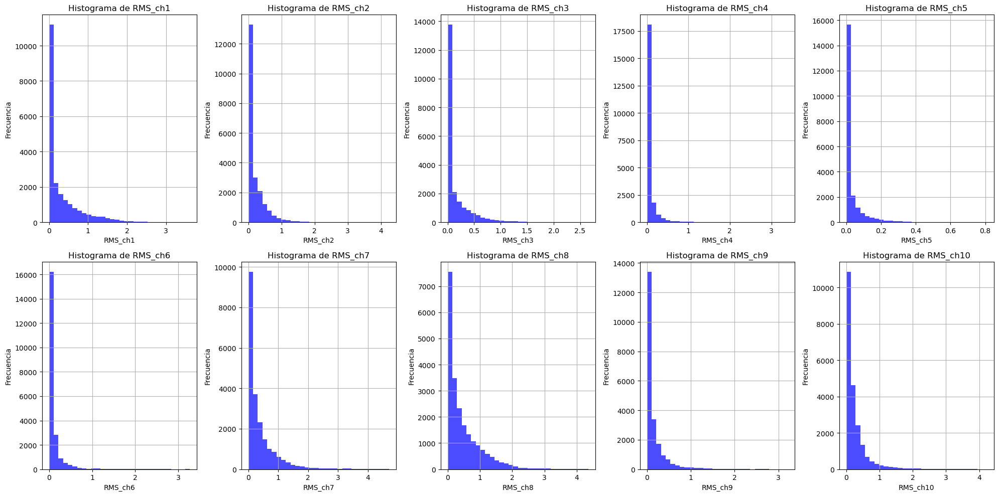

In [26]:
import matplotlib.pyplot as plt

# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un histograma para cada columna
for i, col in enumerate(rms_columns):
    rms_df[col].hist(ax=axes[i], bins=30, alpha=0.7, color='blue')
    axes[i].set_title(f'Histograma de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

# Ajustar el diseño
plt.tight_layout()
plt.show()

* Diagramas de cajas y bigotes

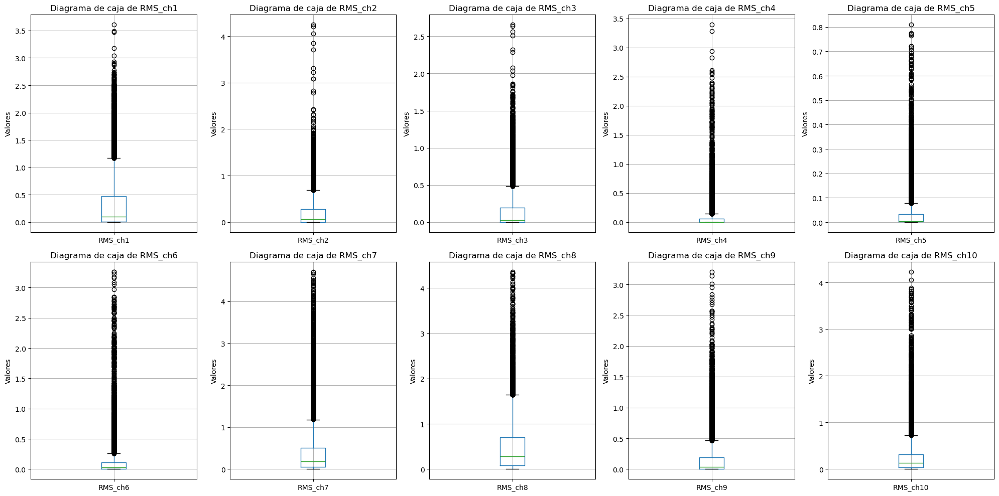

In [27]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un diagrama de caja para cada columna
for i, col in enumerate(rms_columns):
    rms_df.boxplot(column=col, ax=axes[i])
    axes[i].set_title(f'Diagrama de caja de {col}')
    axes[i].set_ylabel('Valores')

# Ajustar el diseño
plt.tight_layout()
plt.show()

* Asimetria y curtosis

In [30]:
# Calcular asimetría y curtosis para las columnas RMS
asimetria = rms_df[rms_columns].skew()
curtosis = rms_df[rms_columns].kurt()

# Mostrar los resultados
print("Asimetría:")
print(asimetria)
print("\nCurtosis:")
print(curtosis)

Asimetría:
RMS_ch1     1.964285
RMS_ch2     2.981277
RMS_ch3     2.627824
RMS_ch4     6.596876
RMS_ch5     4.058238
RMS_ch6     5.849546
RMS_ch7     2.936527
RMS_ch8     1.984222
RMS_ch9     3.614030
RMS_ch10    3.806407
dtype: float64

Curtosis:
RMS_ch1      4.028442
RMS_ch2     16.272895
RMS_ch3      8.921317
RMS_ch4     60.747654
RMS_ch5     23.019549
RMS_ch6     45.000376
RMS_ch7     11.989366
RMS_ch8      5.374856
RMS_ch9     18.359057
RMS_ch10    21.009009
dtype: float64


##### 5.1.2.2. Variables categoricas

* Frecuencia de categorías

Para el caso solo nos vamos a centrar en las categorias asociadas a la postura.

In [31]:
# Frecuencia de categorías en 'restimulus_cat'
restimulus_freq = rms_df['restimulus_cat'].value_counts()
print("Frecuencia de categorías en 'restimulus_cat':")
print(restimulus_freq)

Frecuencia de categorías en 'restimulus_cat':
restimulus_cat
 0.0     9809
 23.0    5810
 1.0     4424
-1.0     1551
Name: count, dtype: int64


* Gráficos de barras

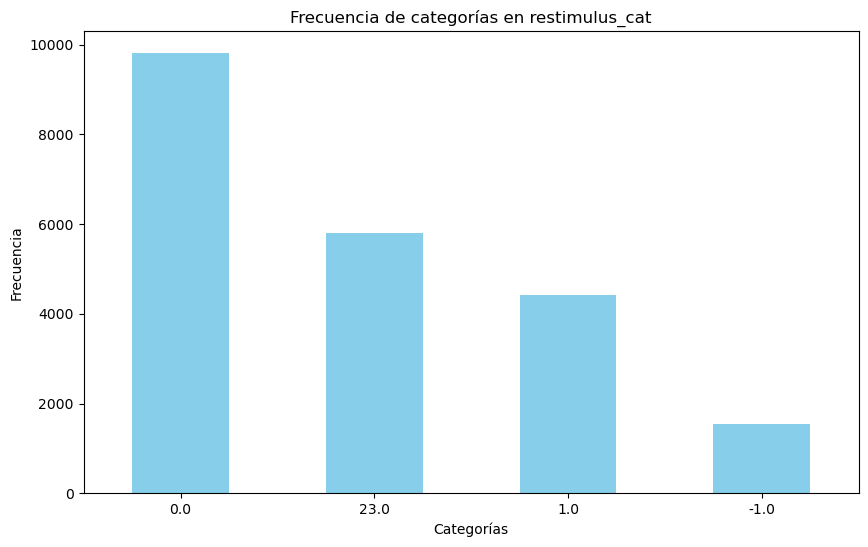

In [32]:
# Crear un gráfico de barras para las frecuencias de 'restimulus_cat'
restimulus_freq.plot(kind='bar', color='skyblue', figsize=(10, 6))
plt.title('Frecuencia de categorías en restimulus_cat')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.show()

Vemos que los datos se encuentran desbalanceados y que ademas los tags relacionados con la transición entre posturas y reposo pueden ser eliminados para los analisis que siguen.

In [35]:
rms_df = rms_df[rms_df['restimulus_cat'] != -1]

Verificacion de los resuldatos

In [36]:
restimulus_freq = rms_df['restimulus_cat'].value_counts()
print("Frecuencia de categorías en 'restimulus_cat':")
print(restimulus_freq)

Frecuencia de categorías en 'restimulus_cat':
restimulus_cat
 0.0     9809
 23.0    5810
 1.0     4424
-1.0        0
Name: count, dtype: int64


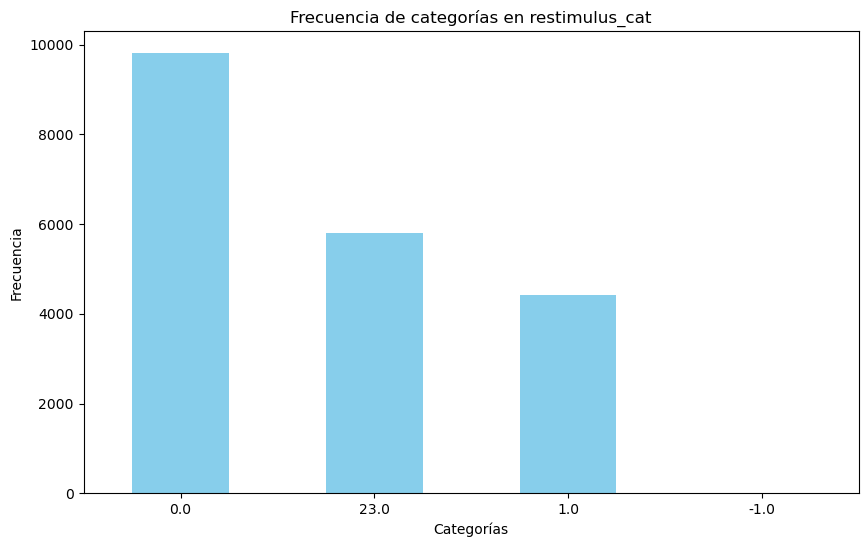

In [37]:
# Crear un gráfico de barras para las frecuencias de 'restimulus_cat'
restimulus_freq.plot(kind='bar', color='skyblue', figsize=(10, 6))
plt.title('Frecuencia de categorías en restimulus_cat')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.show()

#### 5.1.3. Analisis bivariado

##### 5.1.3.1. Numerico .vs. numerico

* Matriz de correlación

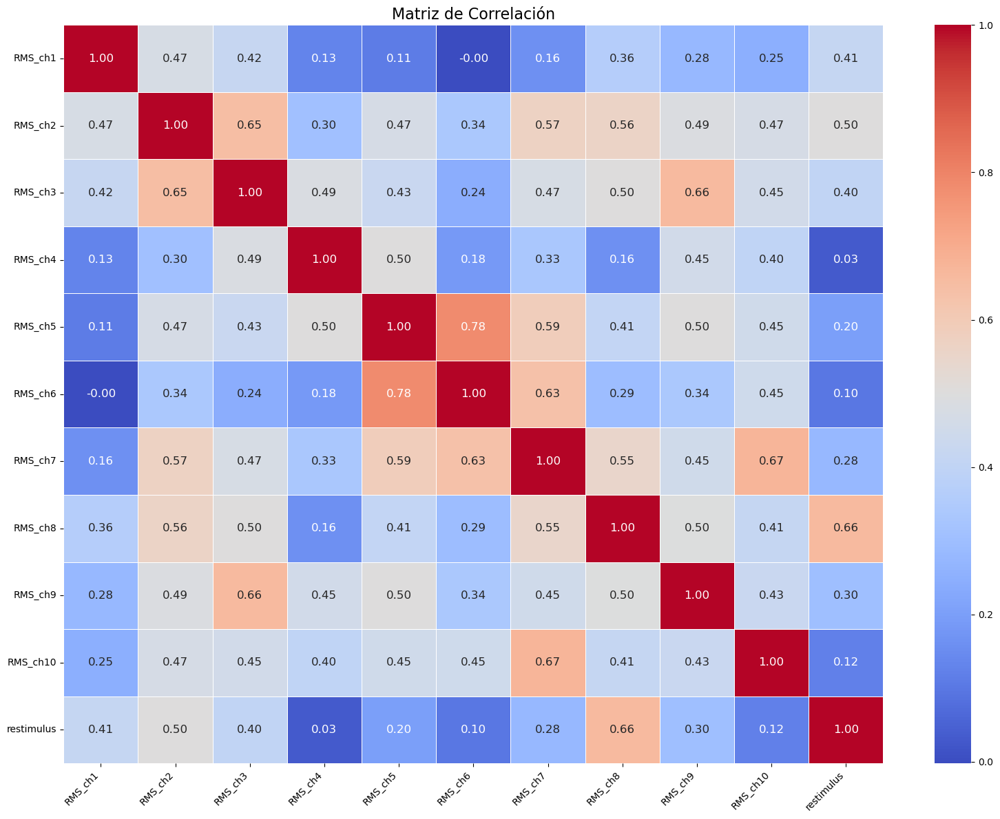

In [38]:
# Calcular la matriz de correlación
corr = rms_df[rms_columns + ['restimulus']].corr()

# Establecer el tamaño de la figura y la resolución
plt.figure(figsize=(16, 12), dpi=100)

# Crear el mapa de calor con anotaciones más grandes y líneas divisorias
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    annot_kws={"size": 12},
    linewidths=0.5,
    linecolor='white'
)

# Ajustar las etiquetas de los ejes para mejorar la legibilidad
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Establecer el título del mapa de calor
plt.title("Matriz de Correlación", fontsize=16)

# Mostrar el gráfico
plt.tight_layout()
plt.show()


* Diagramas de dispersión (Scatter plots)

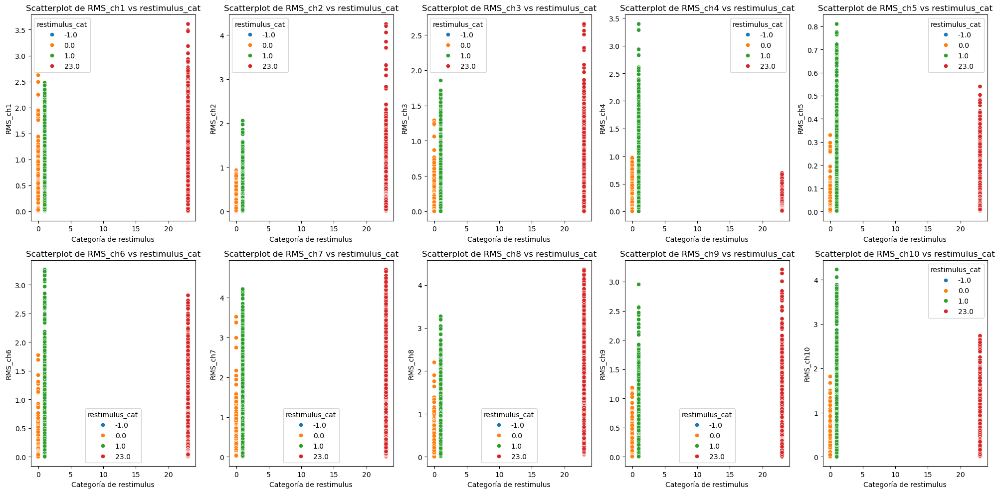

In [39]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un scatterplot para cada columna EMG
for i, col in enumerate(rms_columns):
    sns.scatterplot(x='restimulus_cat', y=col, data=rms_df, ax=axes[i], hue='restimulus_cat', palette='tab10', legend=True)
    axes[i].set_title(f'Scatterplot de {col} vs restimulus_cat')
    axes[i].set_xlabel('Categoría de restimulus')
    axes[i].set_ylabel(col)

# Ajustar el diseño
plt.tight_layout()
plt.show()

* Pairplot (grafico de pares)

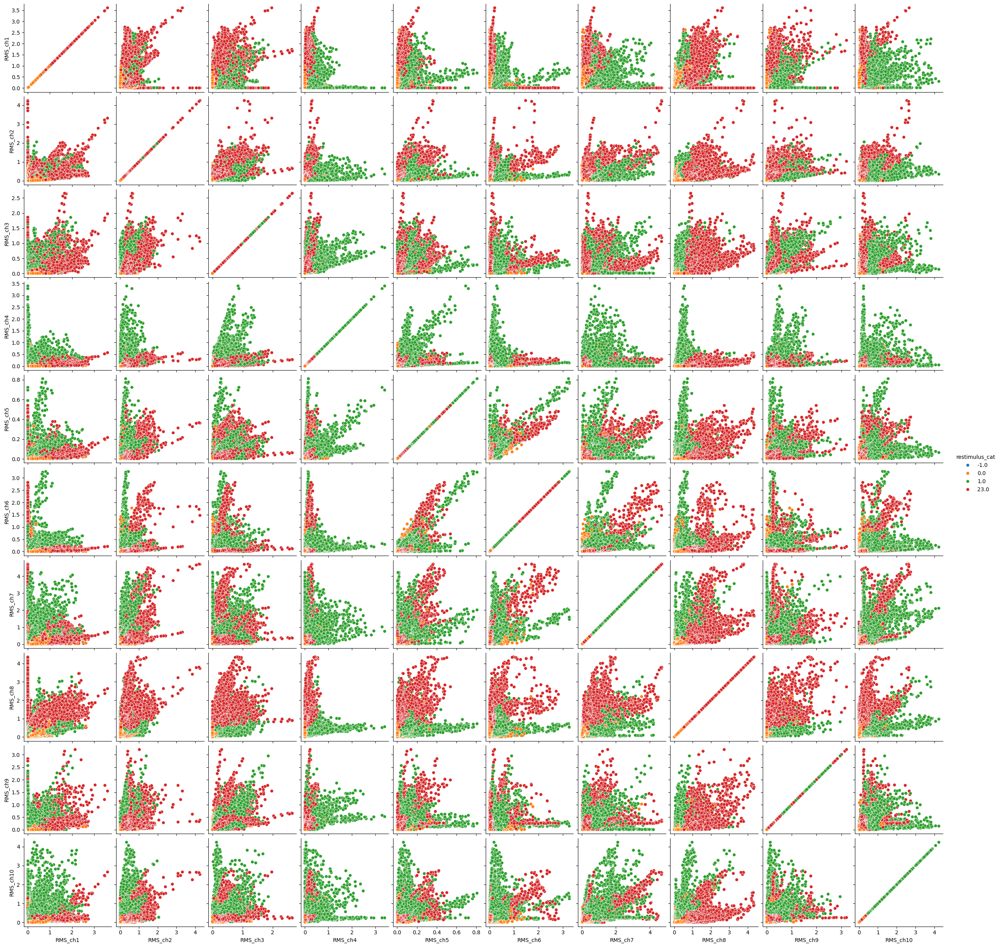

In [40]:
import seaborn as sns

# Crear un pairplot para las columnas RMS con restimulus_cat como hue, sin kde y mostrando la leyenda
sns.pairplot(rms_df, vars=rms_columns, hue='restimulus_cat', palette='tab10', diag_kind=None, height=2.5, corner=False, plot_kws={'legend': True})

# Mostrar el gráfico
plt.show()

##### 5.1.3.2. Categórico vs. Numérico

* Boxplots por categoría:

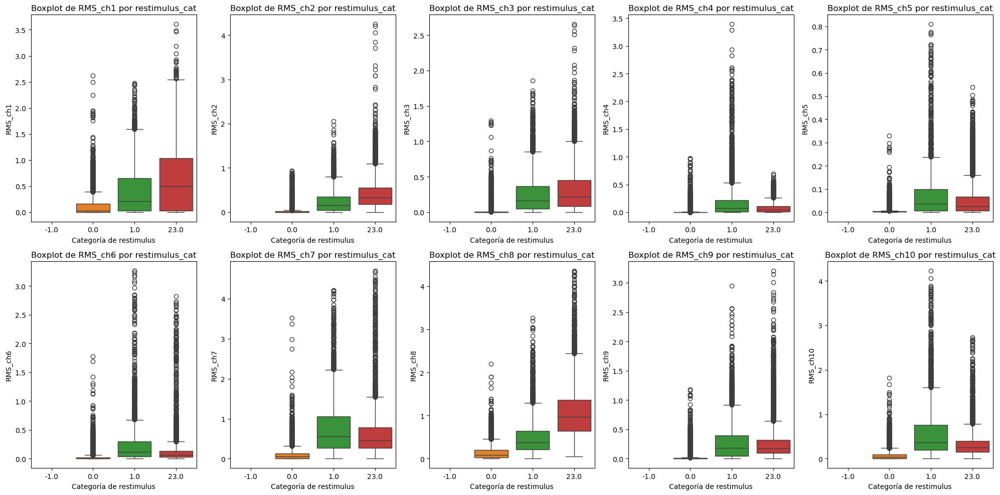

In [41]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un boxplot para cada columna RMS con colores distintos por categoría
for i, col in enumerate(rms_columns):
    sns.boxplot(x='restimulus_cat', y=col, data=rms_df, ax=axes[i], hue='restimulus_cat', palette='tab10', dodge=False, legend=False)
    axes[i].set_title(f'Boxplot de {col} por restimulus_cat')
    axes[i].set_xlabel('Categoría de restimulus')
    axes[i].set_ylabel(col)

# Ajustar el diseño
plt.tight_layout()
plt.show()

##### 5.1.3.3. Categórico vs. Categórico

* Tablas de contingencia

In [42]:
# Crear una tabla de contingencia entre 'restimulus_cat' y 'subject_cat'
contingency_table = pd.crosstab(rms_df['restimulus_cat'], rms_df['subject_cat'])

# Mostrar la tabla de contingencia
contingency_table.T

restimulus_cat,0.0,1.0,23.0
subject_cat,,,
1,312,187,242
2,361,176,208
3,376,152,207
4,405,169,165
5,324,185,240
6,376,163,207
7,392,147,196
8,360,168,216
9,343,173,231


La grafica anterior se ve mas clara como grafico (Matrix tap)

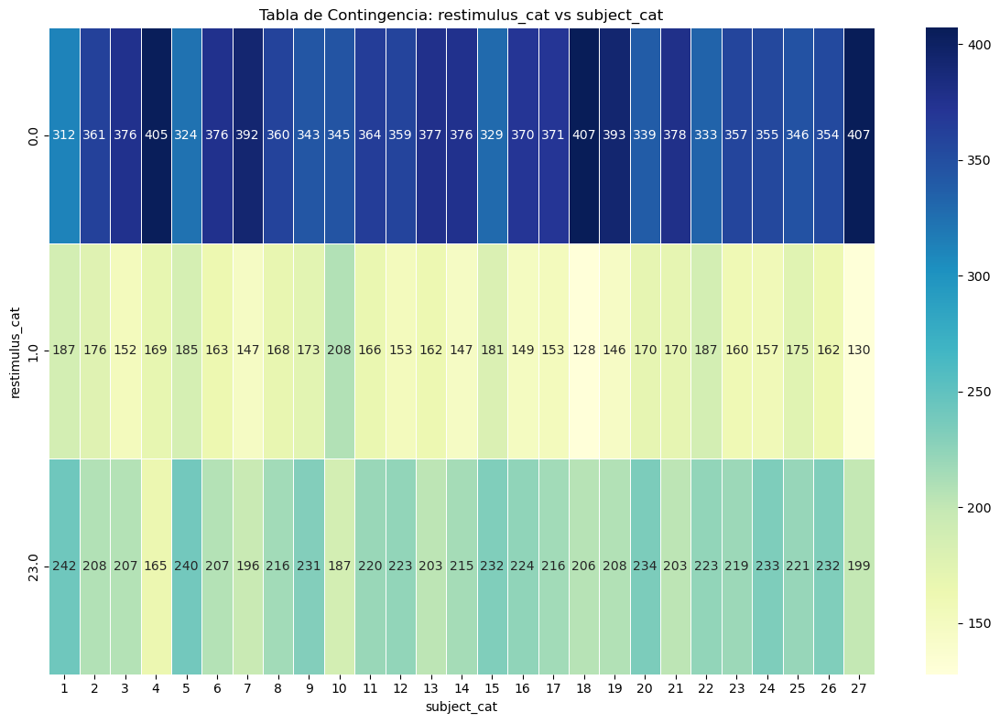

In [43]:
plt.figure(figsize=(12, 8))
sns.heatmap(contingency_table, annot=True, fmt="d", cmap="YlGnBu", cbar=True, linewidths=0.5)
plt.title("Tabla de Contingencia: restimulus_cat vs subject_cat")
plt.xlabel("subject_cat")
plt.ylabel("restimulus_cat")
plt.tight_layout()
plt.show()

* Graficos de barras apiladas

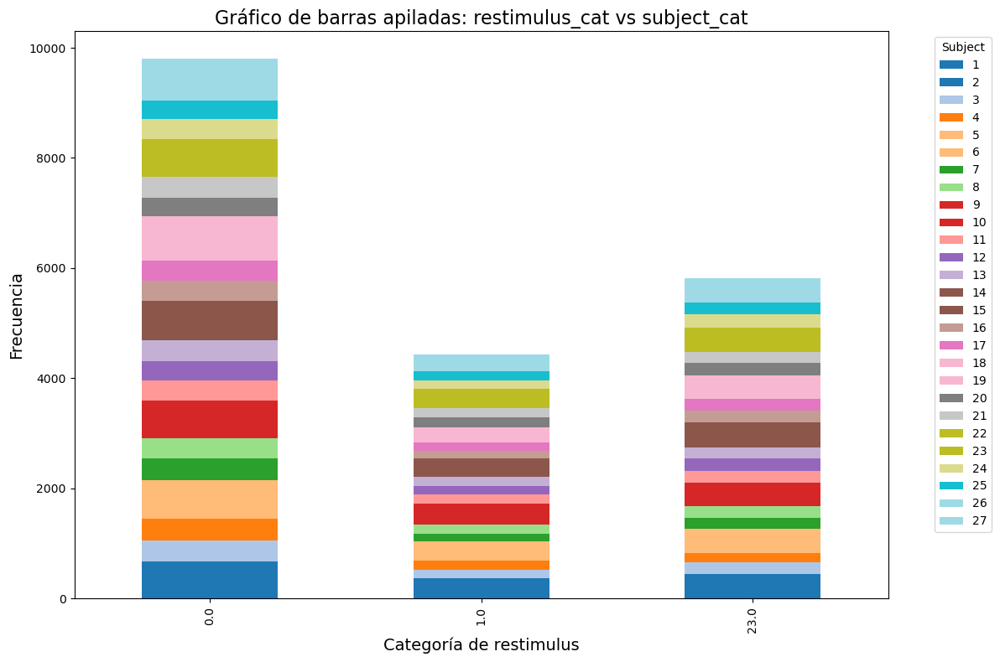

In [44]:
# Crear un gráfico de barras apiladas a partir de la tabla de contingencia
contingency_table.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='tab20')

# Configurar el título y las etiquetas
plt.title('Gráfico de barras apiladas: restimulus_cat vs subject_cat', fontsize=16)
plt.xlabel('Categoría de restimulus', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.legend(title='Subject', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Mostrar el gráfico
plt.show()

### 5.2. WL


In [51]:
wl_df = features_dict['WL']
wl_df.head()

,WL_ch1,WL_ch2,WL_ch3,WL_ch4,WL_ch5,WL_ch6,WL_ch7,WL_ch8,WL_ch9,WL_ch10,restimulus,subject,restimulus_cat,subject_cat
0,0.106641,0.076213,0.007215,0.000068,0.000094,0.000581,0.034643,0.079613,0.000366,0.035208,0.0,10,0.0,10
1,0.049349,0.033643,0.036538,0.000085,0.000141,0.002311,0.103924,0.354562,0.000337,0.197743,0.0,10,0.0,10
2,0.172856,0.040341,0.134860,0.000176,0.000825,0.003709,0.137281,0.655771,0.001938,0.463982,-1.0,10,-1.0,10
3,0.335438,0.090400,0.224078,0.000936,0.002410,0.001777,0.078484,0.537102,0.006376,0.533252,1.0,10,1.0,10
4,0.426215,0.096118,0.172328,0.002034,0.004095,0.000169,0.019049,0.166585,0.008314,0.326229,1.0,10,1.0,10


In [52]:
wl_df.shape

(21594, 14)

De entrada vamos a eliminar los registros cuya caracteristica `restimulus_cat` es -1

In [53]:
wl_df = wl_df[wl_df['restimulus_cat'] != -1]
# Se verifica el resultado
wl_df.shape

(20043, 14)

#### 5.2.1. Inspección Inicial del Dataset

* Dimensiones del DataFrame

In [54]:
wl_df.shape

(20043, 14)

* Tipos de datos


In [55]:
wl_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20043 entries, 0 to 21593
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   WL_ch1          20043 non-null  float64 
 1   WL_ch2          20043 non-null  float64 
 2   WL_ch3          20043 non-null  float64 
 3   WL_ch4          20043 non-null  float64 
 4   WL_ch5          20043 non-null  float64 
 5   WL_ch6          20043 non-null  float64 
 6   WL_ch7          20043 non-null  float64 
 7   WL_ch8          20043 non-null  float64 
 8   WL_ch9          20043 non-null  float64 
 9   WL_ch10         20043 non-null  float64 
 10  restimulus      20043 non-null  float64 
 11  subject         20043 non-null  int64   
 12  restimulus_cat  20043 non-null  category
 13  subject_cat     20043 non-null  category
dtypes: category(2), float64(11), int64(1)
memory usage: 2.0 MB


* Valores nulos

In [56]:
wl_df.isnull().sum()

WL_ch1            0
WL_ch2            0
WL_ch3            0
WL_ch4            0
WL_ch5            0
WL_ch6            0
WL_ch7            0
WL_ch8            0
WL_ch9            0
WL_ch10           0
restimulus        0
subject           0
restimulus_cat    0
subject_cat       0
dtype: int64

* Estadísticas descriptivas

In [58]:
wl_columns = [col for col in wl_df.columns if "WL" in col]
wl_df[wl_columns].describe()

,WL_ch1,WL_ch2,WL_ch3,WL_ch4,WL_ch5,WL_ch6,WL_ch7,WL_ch8,WL_ch9,WL_ch10
count,2.004300e+04,2.004300e+04,2.004300e+04,2.004300e+04,2.004300e+04,2.004300e+04,2.004300e+04,20043.000000,2.004300e+04,2.004300e+04
mean,7.782427e-02,5.946985e-02,5.206086e-02,2.901003e-02,1.139972e-02,3.317487e-02,1.025470e-01,0.103498,5.071754e-02,6.504327e-02
std,1.295308e-01,9.988987e-02,9.450908e-02,8.251305e-02,2.579224e-02,8.845988e-02,1.765386e-01,0.155127,1.092964e-01,1.280037e-01
min,7.472179e-07,2.677752e-09,8.889412e-08,8.693092e-11,6.979522e-09,2.719072e-09,8.087929e-07,0.000001,2.958806e-10,3.441999e-07
25%,2.306730e-03,1.699972e-03,4.441480e-04,9.702401e-05,1.159467e-04,1.317899e-03,9.150808e-03,0.011467,5.035996e-04,4.915725e-03
50%,2.329261e-02,1.936348e-02,1.168172e-02,2.694024e-03,1.853600e-03,8.042415e-03,3.899898e-02,0.044519,8.533931e-03,1.957152e-02
75%,9.675056e-02,7.404262e-02,6.104627e-02,2.061985e-02,1.183521e-02,2.759960e-02,1.206347e-01,0.130850,4.950647e-02,6.685170e-02
max,1.487103e+00,1.820972e+00,9.812263e-01,1.236877e+00,4.495883e-01,1.718625e+00,2.262450e+00,1.904354,1.701483e+00,1.974205e+00


#### 5.2.2. Analisis univariado

##### 5.2.2.1. Variables numericas

* Histogramas

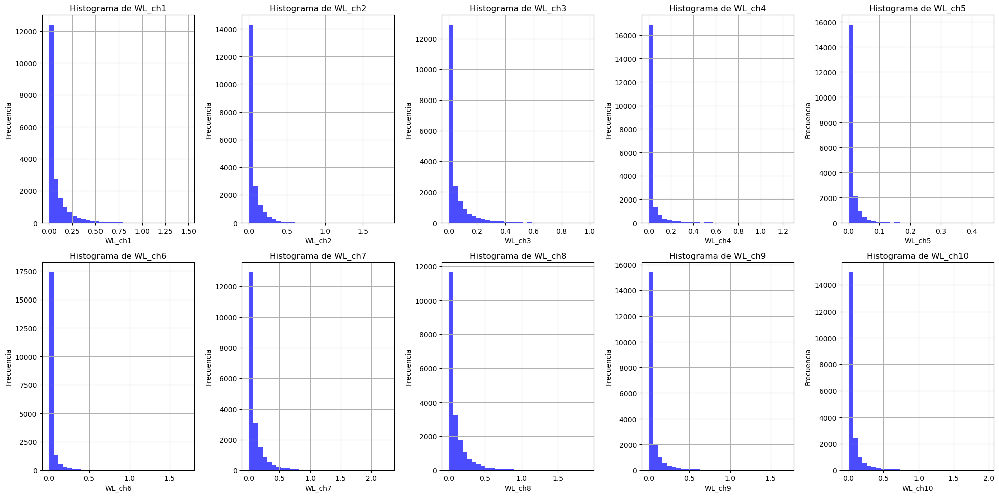

In [59]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un histograma para cada columna
for i, col in enumerate(wl_columns):
    wl_df[col].hist(ax=axes[i], bins=30, alpha=0.7, color='blue')
    axes[i].set_title(f'Histograma de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

# Ajustar el diseño
plt.tight_layout()
plt.show()

* Diagramas de cajas y bigotes

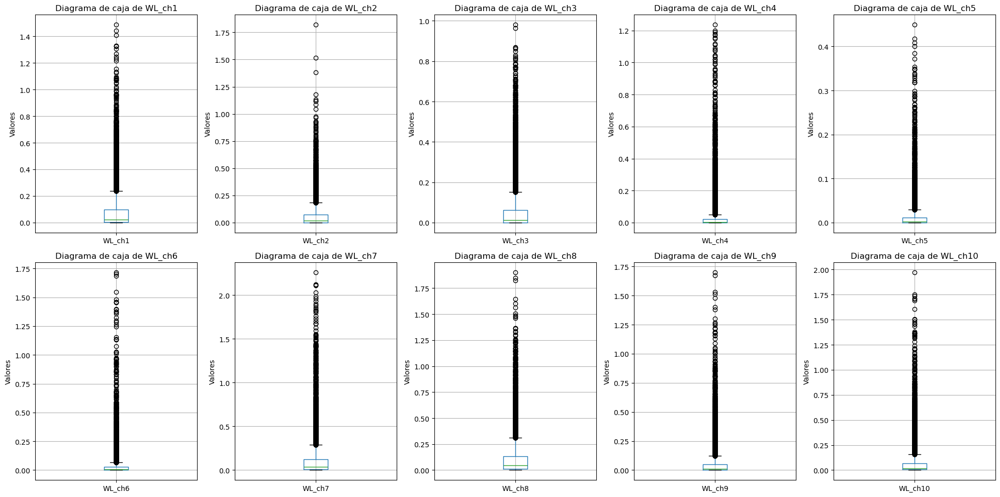

In [60]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un diagrama de caja para cada columna
for i, col in enumerate(wl_columns):
    wl_df.boxplot(column=col, ax=axes[i])
    axes[i].set_title(f'Diagrama de caja de {col}')
    axes[i].set_ylabel('Valores')

# Ajustar el diseño
plt.tight_layout()
plt.show()

* Asimetria y curtosis

In [61]:
# Calcular asimetría y curtosis para las columnas RMS
asimetria = wl_df[wl_columns].skew()
curtosis = wl_df[wl_columns].kurt()

# Mostrar los resultados
print("Asimetría:")
print(asimetria)
print("\nCurtosis:")
print(curtosis)

Asimetría:
WL_ch1     3.194776
WL_ch2     3.692570
WL_ch3     3.299483
WL_ch4     6.412612
WL_ch5     5.956767
WL_ch6     7.844841
WL_ch7     4.221691
WL_ch8     3.272107
WL_ch9     4.845158
WL_ch10    4.825262
dtype: float64

Curtosis:
WL_ch1     14.717252
WL_ch2     23.834231
WL_ch3     14.336930
WL_ch4     55.820989
WL_ch5     54.537369
WL_ch6     90.544944
WL_ch7     26.024617
WL_ch8     15.831413
WL_ch9     35.484935
WL_ch10    34.643607
dtype: float64


##### 5.2.2.2. Variables categoricas

* Frecuencia de categorías: No es necesario pues es el mismo del caso de rms.
* Gráficos de barras: Tambien es el mismo

#### 5.2.3.  Analisis bivariado

##### 5.2.3.1. Numerico .vs. numerico

* Matriz de correlación

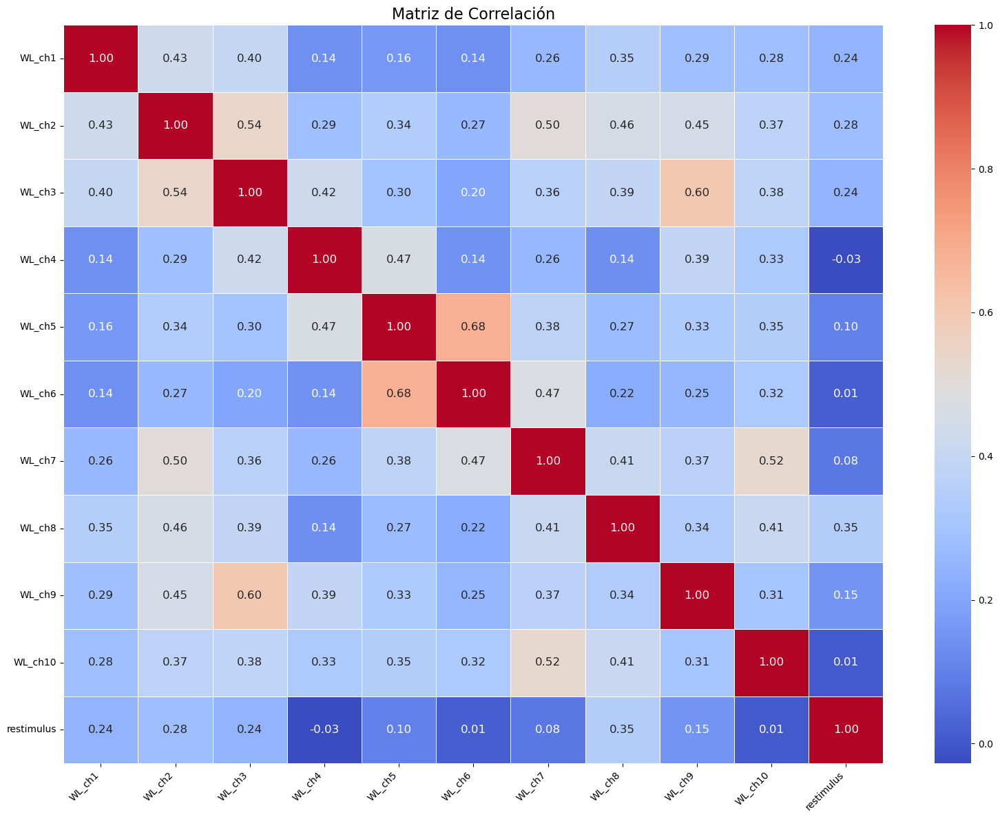

In [63]:
# Calcular la matriz de correlación
corr_wl = wl_df[wl_columns + ['restimulus']].corr()

# Establecer el tamaño de la figura y la resolución
plt.figure(figsize=(16, 12), dpi=100)

# Crear el mapa de calor con anotaciones más grandes y líneas divisorias
sns.heatmap(
    corr_wl,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    annot_kws={"size": 12},
    linewidths=0.5,
    linecolor='white'
)

# Ajustar las etiquetas de los ejes para mejorar la legibilidad
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Establecer el título del mapa de calor
plt.title("Matriz de Correlación", fontsize=16)

# Mostrar el gráfico
plt.tight_layout()
plt.show()

* Diagramas de dispersión (Scatter plots)

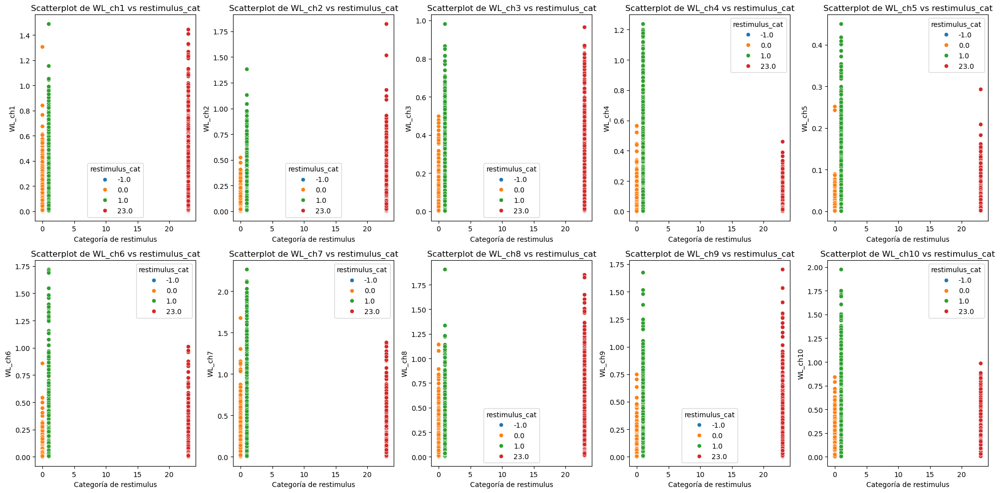

In [65]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un scatterplot para cada columna EMG
for i, col in enumerate(wl_columns):
    sns.scatterplot(x='restimulus_cat', y=col, data=wl_df, ax=axes[i], hue='restimulus_cat', palette='tab10', legend=True)
    axes[i].set_title(f'Scatterplot de {col} vs restimulus_cat')
    axes[i].set_xlabel('Categoría de restimulus')
    axes[i].set_ylabel(col)

# Ajustar el diseño
plt.tight_layout()
plt.show()

* Diagramas de dispersión (Scatter plots)

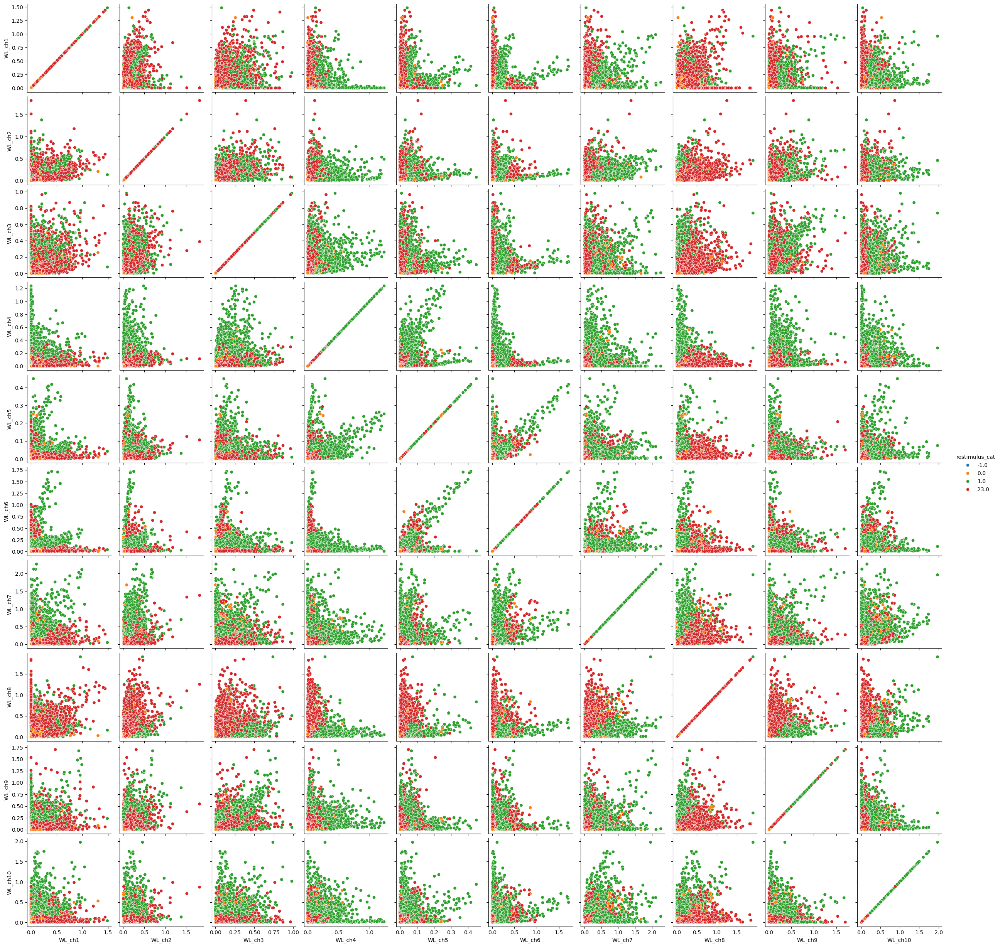

In [66]:
import seaborn as sns

# Crear un pairplot para las columnas RMS con restimulus_cat como hue, sin kde y mostrando la leyenda
sns.pairplot(wl_df, vars=wl_columns, hue='restimulus_cat', palette='tab10', diag_kind=None, height=2.5, corner=False, plot_kws={'legend': True})

# Mostrar el gráfico
plt.show()

##### 5.2.3.2. Categórico vs. Numérico

* Boxplots por categoría:

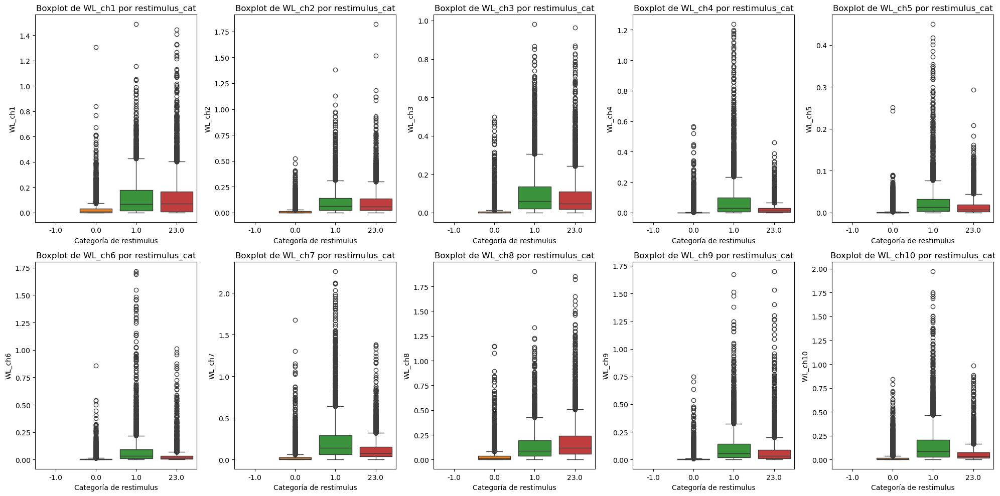

In [67]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un boxplot para cada columna RMS con colores distintos por categoría
for i, col in enumerate(wl_columns):
    sns.boxplot(x='restimulus_cat', y=col, data=wl_df, ax=axes[i], hue='restimulus_cat', palette='tab10', dodge=False, legend=False)
    axes[i].set_title(f'Boxplot de {col} por restimulus_cat')
    axes[i].set_xlabel('Categoría de restimulus')
    axes[i].set_ylabel(col)

# Ajustar el diseño
plt.tight_layout()
plt.show()

##### 5.2.3.3. Categórico vs. Categórico

* Tablas de contingencia

In [68]:
# Crear una tabla de contingencia entre 'restimulus_cat' y 'subject_cat'
contingency_table = pd.crosstab(wl_df['restimulus_cat'], wl_df['subject_cat'])

# Mostrar la tabla de contingencia
contingency_table.T

restimulus_cat,0.0,1.0,23.0
subject_cat,,,
1,312,187,242
2,361,176,208
3,376,152,207
4,405,169,165
5,324,185,240
6,376,163,207
7,392,147,196
8,360,168,216
9,343,173,231


La grafica anterior se ve mas clara como grafico (Matrix tap)

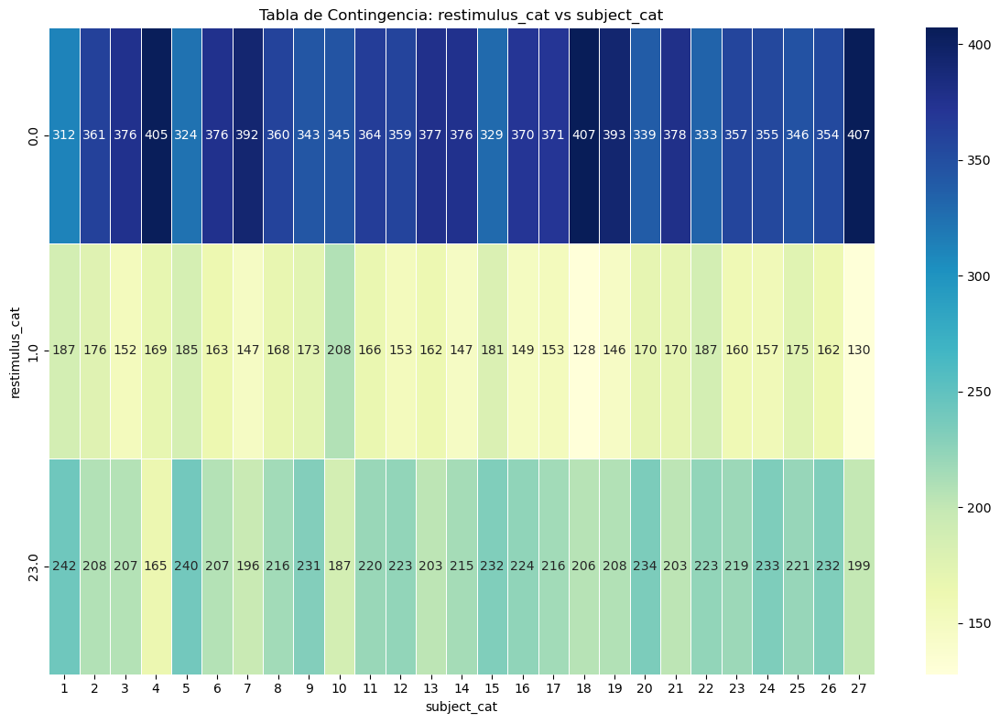

In [69]:
plt.figure(figsize=(12, 8))
sns.heatmap(contingency_table, annot=True, fmt="d", cmap="YlGnBu", cbar=True, linewidths=0.5)
plt.title("Tabla de Contingencia: restimulus_cat vs subject_cat")
plt.xlabel("subject_cat")
plt.ylabel("restimulus_cat")
plt.tight_layout()
plt.show()

### 5.3. IAV

In [70]:
iav_df = features_dict['IAV']
iav_df.head()

,IAV_ch1,IAV_ch2,IAV_ch3,IAV_ch4,IAV_ch5,IAV_ch6,IAV_ch7,IAV_ch8,IAV_ch9,IAV_ch10,restimulus,subject,restimulus_cat,subject_cat
0,5.510804,1.818598,0.232948,0.071085,0.069483,0.069999,0.258277,0.694282,0.064724,0.612147,0.0,10,0.0,10
1,4.416803,0.655907,0.272982,0.069339,0.068797,0.098256,1.571479,3.832499,0.058596,1.669581,0.0,10,0.0,10
2,6.228921,0.733375,1.711660,0.069260,0.077072,0.164330,4.212271,14.597008,0.073951,8.334860,-1.0,10,-1.0,10
3,11.577850,2.134840,5.545176,0.079337,0.109198,0.225469,6.542571,27.803968,0.157240,19.179181,1.0,10,1.0,10
4,19.574575,4.123925,9.960689,0.110684,0.177791,0.241623,7.419627,34.309421,0.322391,28.336134,1.0,10,1.0,10


In [71]:
iav_df.shape

(21594, 14)

Vamos a eliminar todos los datos en los cuales la categoria corresponde a una transición.

In [72]:
iav_df = iav_df[iav_df['restimulus_cat'] != -1]
# Se verifica el resultado
iav_df.shape

(20043, 14)

#### 5.3.1. Inspección Inicial del Dataset

* Dimensiones del DataFrame

In [73]:
iav_df.shape

(20043, 14)

* Tipos de datos

In [74]:
iav_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20043 entries, 0 to 21593
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   IAV_ch1         20043 non-null  float64 
 1   IAV_ch2         20043 non-null  float64 
 2   IAV_ch3         20043 non-null  float64 
 3   IAV_ch4         20043 non-null  float64 
 4   IAV_ch5         20043 non-null  float64 
 5   IAV_ch6         20043 non-null  float64 
 6   IAV_ch7         20043 non-null  float64 
 7   IAV_ch8         20043 non-null  float64 
 8   IAV_ch9         20043 non-null  float64 
 9   IAV_ch10        20043 non-null  float64 
 10  restimulus      20043 non-null  float64 
 11  subject         20043 non-null  int64   
 12  restimulus_cat  20043 non-null  category
 13  subject_cat     20043 non-null  category
dtypes: category(2), float64(11), int64(1)
memory usage: 2.0 MB


* Valores nulos

In [75]:
iav_df.isnull().sum()

IAV_ch1           0
IAV_ch2           0
IAV_ch3           0
IAV_ch4           0
IAV_ch5           0
IAV_ch6           0
IAV_ch7           0
IAV_ch8           0
IAV_ch9           0
IAV_ch10          0
restimulus        0
subject           0
restimulus_cat    0
subject_cat       0
dtype: int64

* Estadísticas descriptivas

In [76]:
iav_columns = [col for col in iav_df.columns if "IAV" in col]
iav_df[iav_columns].describe()

,IAV_ch1,IAV_ch2,IAV_ch3,IAV_ch4,IAV_ch5,IAV_ch6,IAV_ch7,IAV_ch8,IAV_ch9,IAV_ch10
count,20043.000000,20043.000000,20043.000000,20043.000000,20043.000000,20043.000000,20043.000000,20043.000000,20043.000000,20043.000000
mean,10.049128,5.828434,4.643241,2.165569,1.038752,3.359383,11.809301,14.768425,4.696468,7.747792
std,14.324045,8.846175,7.778801,5.797835,2.084103,7.685394,16.386026,16.970967,8.298734,11.531225
min,0.009835,0.007775,0.006477,0.008213,0.007831,0.008739,0.008492,0.010889,0.007846,0.006067
25%,0.188335,0.097383,0.079208,0.072727,0.075471,0.114823,1.467129,2.392528,0.076278,1.067125
50%,3.077646,1.817778,0.621304,0.113348,0.132477,0.953666,5.583527,8.361008,1.074333,4.121249
75%,14.772101,8.642153,6.278797,1.851430,1.002307,3.321202,15.585506,21.922058,5.882540,9.603226
max,108.264320,127.419624,79.682788,101.693707,24.287505,97.868733,141.149942,130.795284,96.176476,126.907712


### 5.3.2. Analisis univariado

##### 5.3.2.1. Variables numericas

* Histogramas

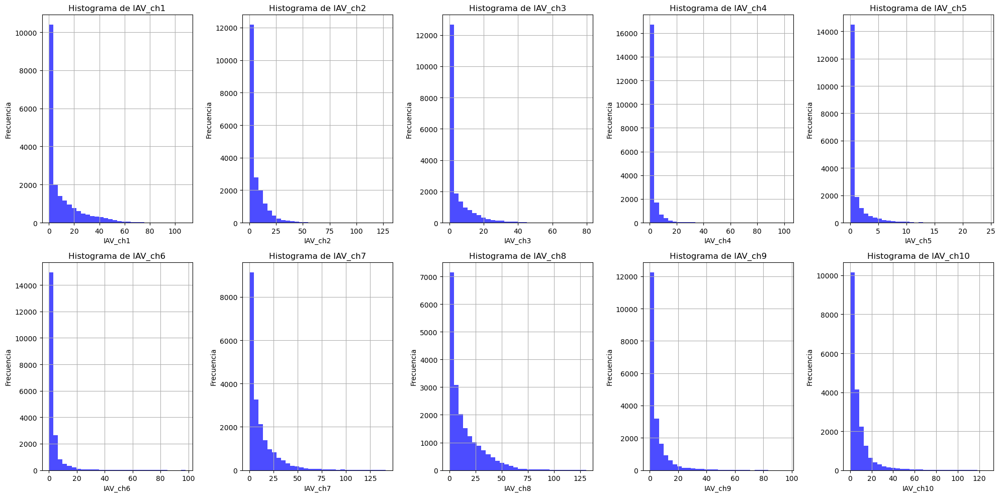

In [77]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un histograma para cada columna
for i, col in enumerate(iav_columns):
    iav_df[col].hist(ax=axes[i], bins=30, alpha=0.7, color='blue')
    axes[i].set_title(f'Histograma de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

# Ajustar el diseño
plt.tight_layout()
plt.show()

* Diagramas de cajas y bigotes

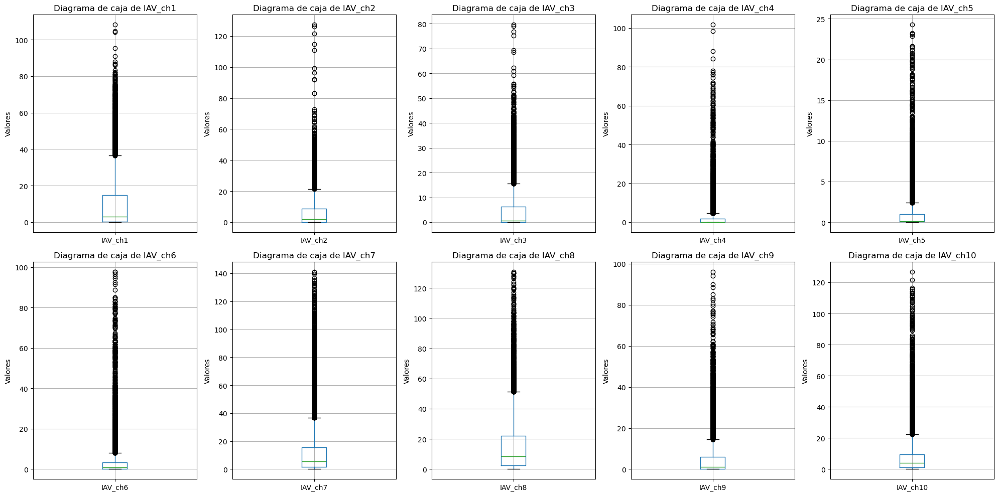

In [78]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un diagrama de caja para cada columna
for i, col in enumerate(iav_columns):
    iav_df.boxplot(column=col, ax=axes[i])
    axes[i].set_title(f'Diagrama de caja de {col}')
    axes[i].set_ylabel('Valores')

# Ajustar el diseño
plt.tight_layout()
plt.show()

* Asimetria y curtosis

In [79]:
# Calcular asimetría y curtosis para las columnas RMS
asimetria = iav_df[iav_columns].skew()
curtosis = iav_df[iav_columns].kurt()

# Mostrar los resultados
print("Asimetría:")
print(asimetria)
print("\nCurtosis:")
print(curtosis)

Asimetría:
IAV_ch1     1.912371
IAV_ch2     2.919122
IAV_ch3     2.556650
IAV_ch4     6.505260
IAV_ch5     3.965487
IAV_ch6     5.743900
IAV_ch7     2.883919
IAV_ch8     1.926250
IAV_ch9     3.537688
IAV_ch10    3.740127
dtype: float64

Curtosis:
IAV_ch1      3.725607
IAV_ch2     15.570759
IAV_ch3      8.405463
IAV_ch4     58.791027
IAV_ch5     21.854642
IAV_ch6     43.094324
IAV_ch7     11.514771
IAV_ch8      5.008041
IAV_ch9     17.518617
IAV_ch10    20.107619
dtype: float64


##### 5.3.2.2. Variables categoricas

* Frecuencia de categorías: No es necesario pues es el mismo todas las caracteristicas.
* Gráficos de barras: Tambien es el mismo para todas las caracteristicas

#### 5.3.3. Analisis bivariado


##### 5.3.3.1. Numerico .vs. numerico

* Matriz de correlación

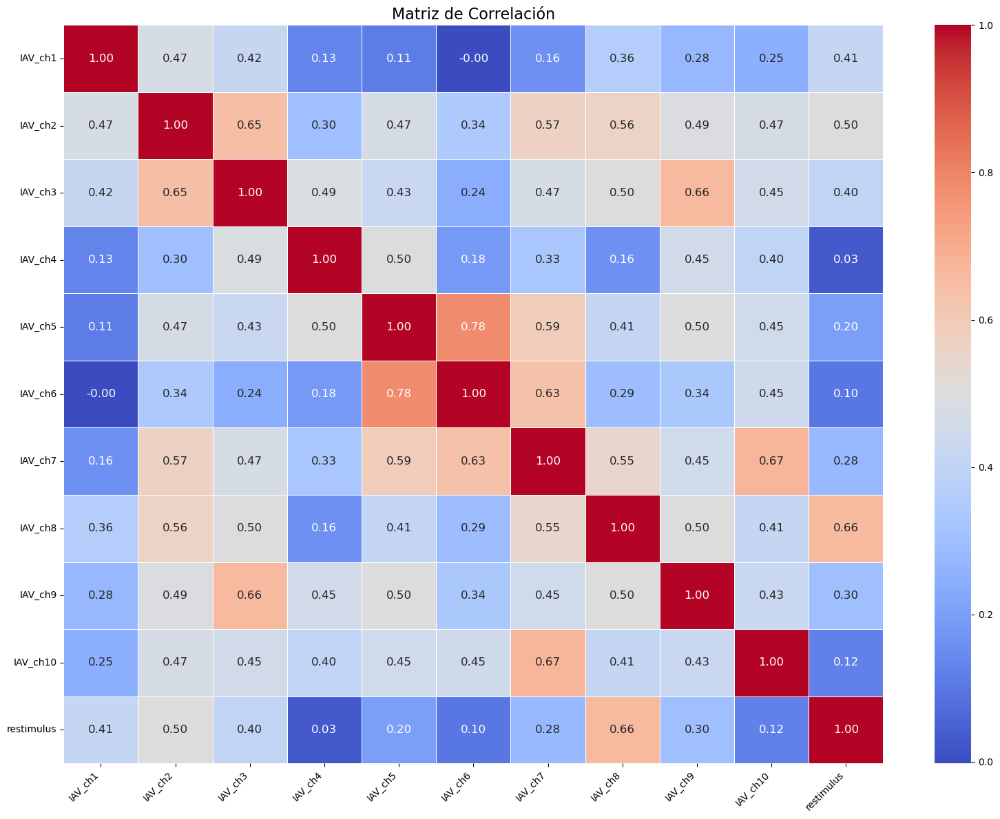

In [80]:
try:
    # Calcular la matriz de correlación
    corr_iav = iav_df[iav_columns + ['restimulus']].corr()

    # Establecer el tamaño de la figura y la resolución
    plt.figure(figsize=(16, 12), dpi=100)

    # Crear el mapa de calor con anotaciones más grandes y líneas divisorias
    sns.heatmap(
        corr_iav,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        annot_kws={"size": 12},
        linewidths=0.5,
        linecolor='white'
    )

    # Ajustar las etiquetas de los ejes para mejorar la legibilidad
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)

    # Establecer el título del mapa de calor
    plt.title("Matriz de Correlación", fontsize=16)

    # Mostrar el gráfico
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"Error al calcular la matriz de correlación: {e}")
    print("Es posible que no haya suficientes datos para calcular la correlación.")

* Diagramas de dispersión (Scatter plots)

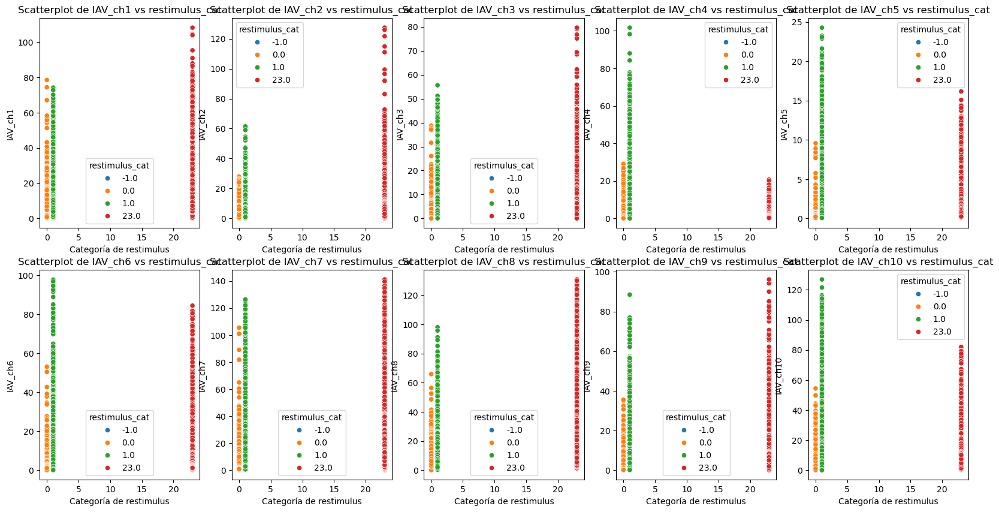

In [81]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un scatterplot para cada columna EMG
for i, col in enumerate(iav_columns):
    sns.scatterplot(x='restimulus_cat', y=col, data=iav_df, ax=axes[i], hue='restimulus_cat', palette='tab10', legend=True)
    axes[i].set_title(f'Scatterplot de {col} vs restimulus_cat')
    axes[i].set_xlabel('Categoría de restimulus')
    axes[i].set_ylabel(col)

* Pairplot (grafico de pares)

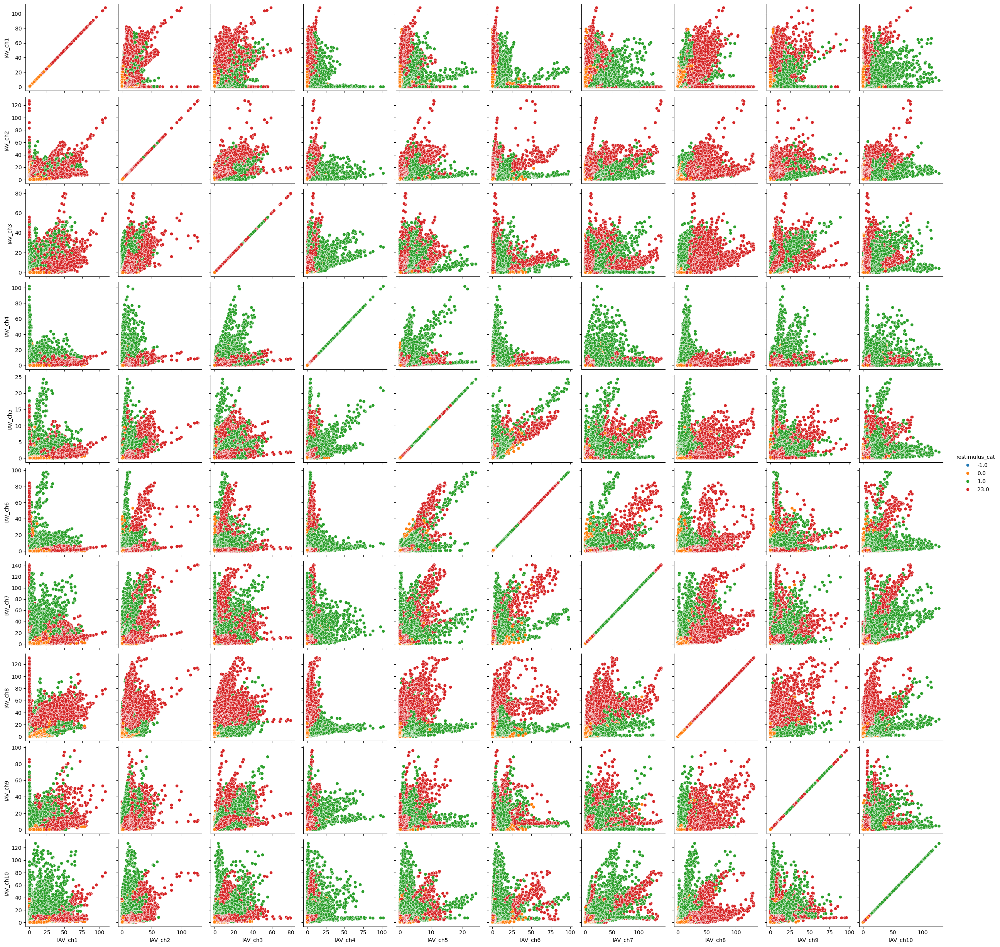

In [82]:
import seaborn as sns

# Crear un pairplot para las columnas RMS con restimulus_cat como hue, sin kde y mostrando la leyenda
sns.pairplot(iav_df, vars=iav_columns, hue='restimulus_cat', palette='tab10', diag_kind=None, height=2.5, corner=False, plot_kws={'legend': True})

# Mostrar el gráfico
plt.show()

##### 5.3.3.2. Categórico vs. Numérico

* Boxplots por categoría:

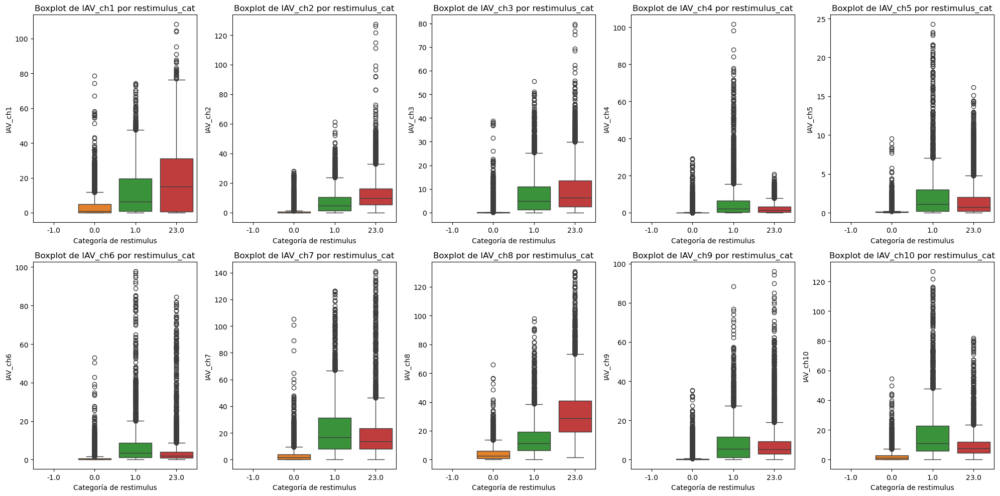

In [83]:
# Crear una figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))  # 2 filas y 5 columnas para 10 columnas en total
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar fácilmente

# Generar un boxplot para cada columna RMS con colores distintos por categoría
for i, col in enumerate(iav_columns):
    sns.boxplot(x='restimulus_cat', y=col, data=iav_df, ax=axes[i], hue='restimulus_cat', palette='tab10', dodge=False, legend=False)
    axes[i].set_title(f'Boxplot de {col} por restimulus_cat')
    axes[i].set_xlabel('Categoría de restimulus')
    axes[i].set_ylabel(col)

# Ajustar el diseño
plt.tight_layout()
plt.show()

##### 5.3.3.3.  Categórico vs. Categórico

In [84]:
# Crear una tabla de contingencia entre 'restimulus_cat' y 'subject_cat'
contingency_table = pd.crosstab(iav_df['restimulus_cat'], iav_df['subject_cat'])

# Mostrar la tabla de contingencia
contingency_table.T

restimulus_cat,0.0,1.0,23.0
subject_cat,,,
1,312,187,242
2,361,176,208
3,376,152,207
4,405,169,165
5,324,185,240
6,376,163,207
7,392,147,196
8,360,168,216
9,343,173,231


La grafica anterior se ve mas clara como grafico (Matrix tap)

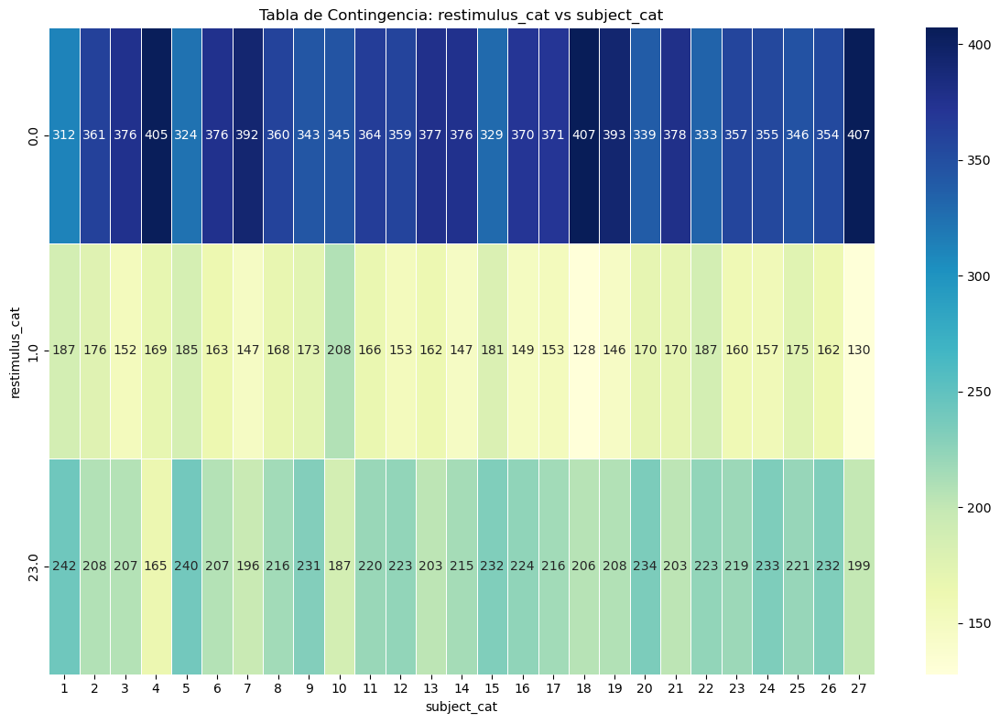

In [85]:
plt.figure(figsize=(12, 8))
sns.heatmap(contingency_table, annot=True, fmt="d", cmap="YlGnBu", cbar=True, linewidths=0.5)
plt.title("Tabla de Contingencia: restimulus_cat vs subject_cat")
plt.xlabel("subject_cat")
plt.ylabel("restimulus_cat")
plt.tight_layout()
plt.show()

* Graficos de barras apiladas

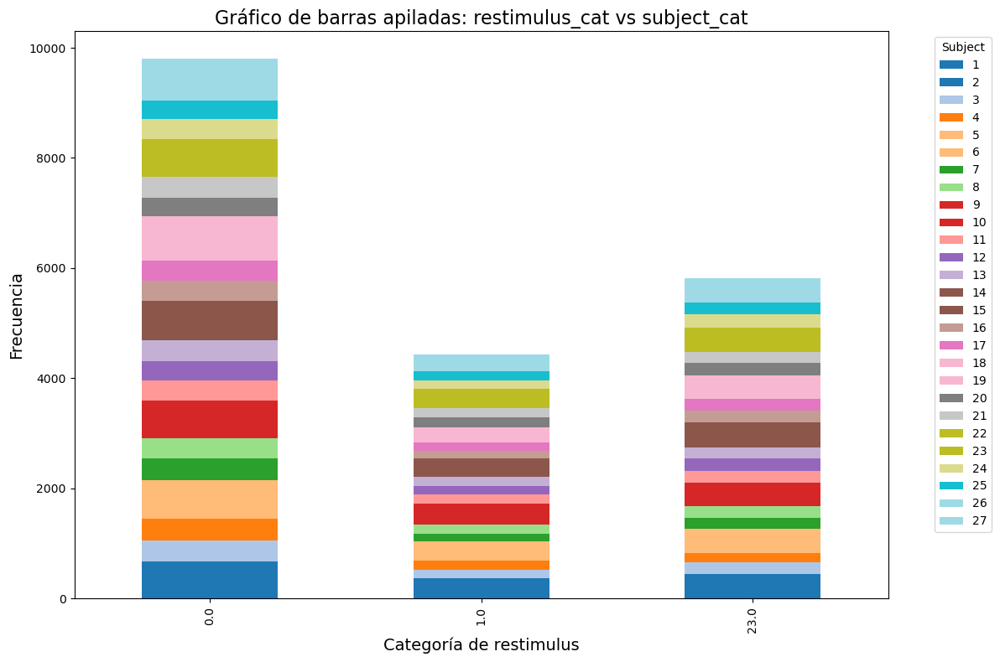

In [86]:
# Crear un gráfico de barras apiladas a partir de la tabla de contingencia
contingency_table.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='tab20')

# Configurar el título y las etiquetas
plt.title('Gráfico de barras apiladas: restimulus_cat vs subject_cat', fontsize=16)
plt.xlabel('Categoría de restimulus', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.legend(title='Subject', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Mostrar el gráfico
plt.show()

## 6. Preparación de datos


### 6.1. Balanceo de los datos

#### 6.1.1. RMS

In [87]:
rms_df.head()

,RMS_ch1,RMS_ch2,RMS_ch3,RMS_ch4,RMS_ch5,RMS_ch6,RMS_ch7,RMS_ch8,RMS_ch9,RMS_ch10,restimulus,subject,restimulus_cat,subject_cat
0,0.186650,0.064954,0.007956,0.002370,0.002316,0.002340,0.011819,0.025321,0.002160,0.021807,0.0,10,0.0,10
1,0.147451,0.024014,0.010991,0.002311,0.002293,0.003349,0.061164,0.166142,0.001954,0.076644,0.0,10,0.0,10
3,0.399017,0.076350,0.197038,0.002660,0.003711,0.007535,0.219384,0.941561,0.005587,0.659597,1.0,10,1.0,10
4,0.664900,0.140433,0.336471,0.003742,0.006055,0.008054,0.247355,1.144152,0.011067,0.949690,1.0,10,1.0,10
5,0.955840,0.202396,0.380185,0.005046,0.008593,0.007723,0.239447,1.084849,0.013835,1.068361,1.0,10,1.0,10


Recordemos que para todas las caracteristicas los datos se encontraban desbalanceados:

In [88]:
# Frecuencia de categorías en 'restimulus_cat'
restimulus_freq = rms_df['restimulus_cat'].value_counts()
print("Frecuencia de categorías en 'restimulus_cat':")
print(restimulus_freq)

Frecuencia de categorías en 'restimulus_cat':
restimulus_cat
 0.0     9809
 23.0    5810
 1.0     4424
-1.0        0
Name: count, dtype: int64


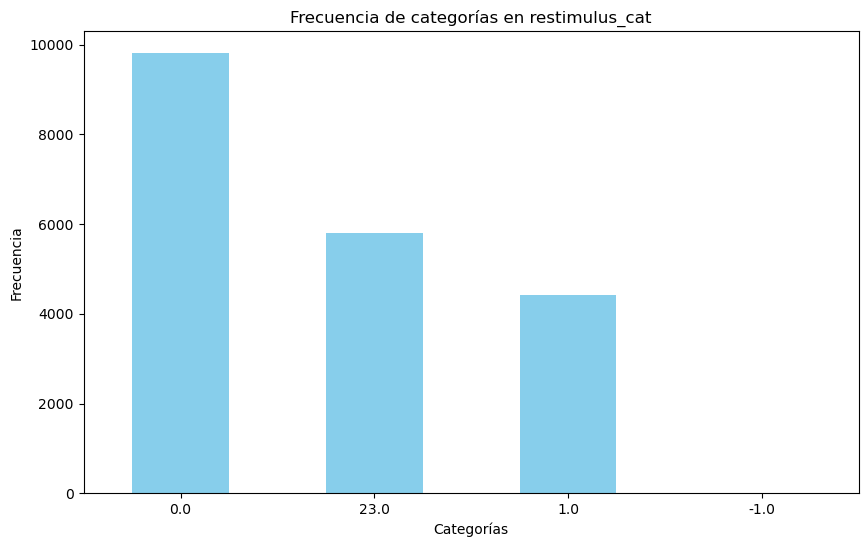

In [89]:
# Crear un gráfico de barras para las frecuencias de 'restimulus_cat'
restimulus_freq.plot(kind='bar', color='skyblue', figsize=(10, 6))
plt.title('Frecuencia de categorías en restimulus_cat')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.show()

In [ ]:
# Separar características y la columna objetivo
X = rms_df[rms_columns]
y = rms_df['restimulus']

# Crear el objeto RandomUnderSampler
rus = RandomUnderSampler(random_state=42)

# Aplicar el submuestreo
X_resampled, y_resampled = rus.fit_resample(X, y)

# Crear un nuevo DataFrame con los datos submuestreados
rms_df_resampled = X_resampled.copy()
rms_df_resampled['restimulus_cat'] = y_resampled

Vamos a obtener los indices resultantes del undersample, estos nos serviran para asegurarnos de que la selección de los indices para las otras dos caracteristicas sean las mismas. 

In [91]:
# Obtener los índices seleccionados
indices = rus.sample_indices_
print(indices)

[10826 13502  3187 ...  6465  6357 18503]


In [92]:
# Se concatenan los dataframes horizontalmente
rms_df_balanced = pd.concat([X_resampled, y_resampled], axis=1)
rms_df_balanced.head()

,RMS_ch1,RMS_ch2,RMS_ch3,RMS_ch4,RMS_ch5,RMS_ch6,RMS_ch7,RMS_ch8,RMS_ch9,RMS_ch10,restimulus
11652,0.002971,0.002011,0.002235,0.002222,0.004159,0.011375,0.168135,0.424274,0.008702,0.178665,0.0
14539,0.002682,0.002494,0.003043,0.002453,0.014639,0.133269,0.051355,0.055463,0.035154,0.531450,0.0
3433,0.002399,0.002400,0.002487,0.002398,0.004415,0.133537,0.006214,0.002398,0.015982,0.008684,0.0
1715,0.972779,0.024917,0.002912,0.002560,0.002688,0.017993,0.084669,0.466418,0.002400,0.094062,0.0
7290,0.245827,0.009948,0.004982,0.003690,0.004121,0.003417,0.033055,0.097625,0.003520,0.074589,0.0


In [93]:
# value_counts() para ver la frecuencia de las categorías
rms_df_balanced['restimulus'].value_counts()

restimulus
0.0     4424
1.0     4424
23.0    4424
Name: count, dtype: int64

#### 6.1.2. WL

Seleccionamos las muestras para el undersample empleando los mismos indices:

In [94]:
wl_df_balanced = wl_df.iloc[indices].copy()
wl_df_balanced.drop(columns=['subject','restimulus_cat','subject_cat'], inplace=True)
wl_df_balanced.head()

,WL_ch1,WL_ch2,WL_ch3,WL_ch4,WL_ch5,WL_ch6,WL_ch7,WL_ch8,WL_ch9,WL_ch10,restimulus
11652,0.000475,1.626367e-03,0.001869,0.001035,0.004105,0.010771,0.037287,0.142162,0.005544,0.037949,0.0
14539,0.000375,1.502025e-04,0.000634,0.000025,0.006091,0.013155,0.001987,0.002508,0.001761,0.032935,0.0
3433,0.000001,1.533455e-07,0.000067,0.000003,0.000416,0.005391,0.001141,0.000001,0.002737,0.001122,0.0
1715,0.036099,3.390028e-03,0.000168,0.000282,0.000037,0.000780,0.002508,0.038131,0.000002,0.006464,0.0
7290,0.123687,1.827021e-03,0.000733,0.000173,0.000089,0.000077,0.007238,0.030180,0.000279,0.012079,0.0


In [95]:
wl_df_balanced['restimulus'].value_counts()

restimulus
0.0     4424
1.0     4424
23.0    4424
Name: count, dtype: int64

#### 6.1.3. IAV

Seleccionamos las muestras para el undersample empleando los mismos indices:

In [96]:
iav_df_balanced = iav_df.iloc[indices].copy()
iav_df_balanced.drop(columns=['subject','restimulus_cat','subject_cat'], inplace=True)
iav_df_balanced.head()

,IAV_ch1,IAV_ch2,IAV_ch3,IAV_ch4,IAV_ch5,IAV_ch6,IAV_ch7,IAV_ch8,IAV_ch9,IAV_ch10,restimulus
11652,0.089021,0.058493,0.064921,0.066013,0.119098,0.326758,5.032751,12.661418,0.256339,5.348835,0.0
14539,0.080393,0.074807,0.091095,0.073575,0.435404,3.996143,1.540565,1.663766,1.054479,15.940786,0.0
3433,0.071976,0.071999,0.074602,0.071952,0.132414,4.005757,0.186269,0.071949,0.478899,0.260285,0.0
1715,29.182164,0.746659,0.087349,0.076761,0.080641,0.539759,2.540024,13.987535,0.072013,2.821168,0.0
7290,7.285961,0.298069,0.149310,0.110700,0.123628,0.102508,0.989107,2.920406,0.105582,2.234625,0.0


In [97]:
iav_df_balanced['restimulus'].value_counts()

restimulus
0.0     4424
1.0     4424
23.0    4424
Name: count, dtype: int64

### 6.2. Almacenamiento de los datos de las caracteristica balanceados

In [103]:
features_dict_balanced = {
    'RMS': rms_df_balanced,
    'WL': wl_df_balanced,
    'IAV': iav_df_balanced
}

In [104]:
FEATURES_SUBSET_BALANCED_DATA

'./local/data/features_subset_balanced'

In [105]:
for feature_type, df in features_dict.items():
    # Filtrar el DataFrame utilizando los índices seleccionados
    #filtered_df = df.iloc[indices]
    print(f"Caracteristica: {feature_type}")

    # Guardar dataframe completo en un archivo CSV
    output_file = os.path.join(FEATURES_SUBSET_BALANCED_DATA, f'{feature_type}_imbalanced.csv')
    df.to_csv(output_file, index=False)
    print(f"-> Archivo concatenado guardado: {output_file}")

    # Guardar el DataFrame balanceado en un archivo CSV
    output_file = os.path.join(FEATURES_SUBSET_BALANCED_DATA, f'{feature_type}_balanced.csv')
    features_dict_balanced[feature_type].to_csv(output_file, index=False)
    print(f"-> Archivo balanceado: {output_file}")

Caracteristica: RMS
-> Archivo concatenado guardado: ./local/data/features_subset_balanced\RMS_imbalanced.csv
-> Archivo balanceado: ./local/data/features_subset_balanced\RMS_balanced.csv
Caracteristica: WL
-> Archivo concatenado guardado: ./local/data/features_subset_balanced\WL_imbalanced.csv
-> Archivo balanceado: ./local/data/features_subset_balanced\WL_balanced.csv
Caracteristica: IAV
-> Archivo concatenado guardado: ./local/data/features_subset_balanced\IAV_imbalanced.csv
-> Archivo balanceado: ./local/data/features_subset_balanced\IAV_balanced.csv
